In [1]:
import numpy as np
import pandas as pd
import os
from pathlib import Path
import time
import glob
import re
import gc

import matplotlib
import matplotlib.image as mpimg
import matplotlib.pyplot as plt

from dask.distributed import Client
from IPython.display import IFrame

from tqdm.notebook import tqdm

from skimage.transform import ProjectiveTransform, AffineTransform, EuclideanTransform, warp
from sklearn.linear_model import (LinearRegression,
                                  TheilSenRegressor,
                                  RANSACRegressor,
                                  HuberRegressor,
                                  RidgeCV,
                                  LassoCV)
import mrcfile
try:
    import skimage.external.tifffile as tiff
except:
    import tifffile as tiff

from SIFT_gs.FIBSEM_SIFT_gs import FIBSEM_frame, FIBSEM_dataset
from SIFT_gs.FIBSEM_SIFT_gs import get_min_max_thresholds
from SIFT_gs.FIBSEM_SIFT_gs import (ShiftTransform,
                                    XScaleShiftTransform,
                                    ScaleShiftTransform,
                                    RegularizedAffineTransform)
            
from SIFT_gs.FIBSEM_SIFT_gs import (generate_report_mill_rate_xlsx,
                                    generate_report_FOV_center_shift_xlsx,
                                    generate_report_data_minmax_xlsx,
                                    generate_report_ScanRate_EHT_xlsx,
                                    generate_report_transf_matrix_from_xlsx,
                                    generate_report_from_xls_registration_summary,
                                    plot_registrtion_quality_xlsx,
                                    read_kwargs_xlsx)
                        
from SIFT_gs.FIBSEM_SIFT_gs import plot_cross_sections_mrc_stack, add_scale_bar
from SIFT_gs.FIBSEM_SIFT_gs import (bin_crop_mrc_stack,
                                    show_eval_box_mrc_stack)
from SIFT_gs.FIBSEM_SIFT_gs import plot_2D_blob_results, plot_2D_blob_examples
from SIFT_gs.FIBSEM_SIFT_gs import build_kernel_FFT_zero_destreaker_XY, build_kernel_FFT_zero_destreaker_radii_angles
from SIFT_gs.FIBSEM_SIFT_gs import (destreak_mrc_stack_with_kernel,
                                    destreak_single_frame_kernel_shared,
                                    smooth_mrc_stack_with_kernel)

skimage version:  0.19.2
scipy version:    1.9.1
sklearn version:  1.0.2
Open CV version:  4.10.0
SIFT_gs version:  4.0.1


# Set up Local DASK Client and Monitor Window

In [2]:
#start / restart client
try:
    client.restart()
except:
    client = Client()
    
# setup a window to monitor the client progress
try:
    dport = client.scheduler_info()['services']['dashboard']
except:
    dport = client.scheduler_info()['services']['bokeh']
print('Using Local Port:   ', dport)
status_update_address0 = 'http://localhost:{:d}/status'.format(dport)
print('Use ' + status_update_address0 +' to monitor DASK progress')
status_update_address = 'http://localhost:{:d}/status'.format(dport)
IFrame(src=status_update_address, width='100%', height='900px')


C:\Users\labadmin\anaconda3\lib\site-packages\distributed\node.py:179: UserWarning: Port 8787 is already in use.
Perhaps you already have a cluster running?
Hosting the HTTP server on port 64094 instead
  warnings.warn(


Using Local Port:    64094
Use http://localhost:64094/status to monitor DASK progress


# Step 0a: Select the Source Directory and Source Files.

In [3]:
fls_dir0 = os.path.normpath('Y:\Images Jeiss7\Cryo\Y2023')
fls_dir1 = os.path.normpath('Y:\Images Jeiss7\Cryo\Y2023\M10')
days1 = ['M10/D{:02d}'.format(day) for day in np.arange(26, 32)]
fls_dir2 = os.path.normpath('Y:\Images Jeiss7\Cryo\Y2023\M11')
days2 = ['M11/D{:02d}'.format(day) for day in np.arange(1, 11)]

days = days1+days2
days

['M10/D26',
 'M10/D27',
 'M10/D28',
 'M10/D29',
 'M10/D30',
 'M10/D31',
 'M11/D01',
 'M11/D02',
 'M11/D03',
 'M11/D04',
 'M11/D05',
 'M11/D06',
 'M11/D07',
 'M11/D08',
 'M11/D09',
 'M11/D10']

In [4]:
fls=[]
ftype=0
for day in days:
    fls_dir_t = os.path.join(fls_dir0, day)
    if ftype == 0:
        fls1 = sorted(glob.glob(os.path.join(fls_dir_t,'*.dat')))
        if len(fls1) < 1:
            fls1 = sorted(glob.glob(os.path.join(fls_dir_t,'*/*.dat')))
    if ftype == 1:
        fls1 = sorted(glob.glob(os.path.join(fls_dir_t,'*.tif')))
        if len(fls1) < 1:
            fls1 = sorted(glob.glob(os.path.join(fls_dir_t,'*/*.tif')))
    fls = fls + fls1

fls = fls[2000:2500]
nfrs = len(fls)
print('Total Number of frames to process: ', nfrs) 

Total Number of frames to process:  500


# Notes from Jeiss6 machine
		
10/23/2023 loaded Cryo_LoadID_674_ROI1
	2:56 pm removed Cryo_LoadID_676_ROI20, loaded Cryo_LoadID_674_ROI1, then pumped down system

10/24/2023 started Cryo_LoadID_674_ROI1
	9:29 am reheated FIB source at lifetime at 3265.38 µAh again, reheat filament voltage up to 1.112V at 3.95A, soft ignite -181 µA at -8.3 kV emission emission stable at -1.5µA at targeted extractor voltage of -7.15 kV with suppressor voltage of 867 V, dV/dI slope -6.47
	11:39 am started coarse milling BF=105X61 µm
	5:00 pm started fine milling SEM size: 30X7µm, single tile
	
10/25/2023 continued Cryo_LoadID_674_ROI1
	5:23 am changed CL from 4.0nA/4.0s to 4.0nA/4.3s
	10:18 am changed CL from 4.0nA/4.3s to 4.0nA/4.5s
	1:38 pm changed CL from 4.0nA/4.5s to 4.0nA/4.3s
	8:14 pm changed CL from 4.0nA/4.3s to 4.0nA/4.0s
	
10/26/2023 continued Cryo_LoadID_674_ROI1
	8:14 pm changed CL from 4.0nA/4.0s to 3.8nA/4.0s
	
10/27/2023 continued Cryo_LoadID_674_ROI1
	5:44 pm changed CL from 3.8nA/4.0s to 3.8nA/3.8s
	2:13 pm changed CL from3.8nA/3.8s to 3.8nA/4.0s
	3:52 pm changed CL from3.8nA/4.0s to 4.0nA/4.0s
	
10/28/2023 continued Cryo_LoadID_674_ROI1
	8:02 am changed CL from 4.0nA/4.0s to 4.0nA/4.2s
	11:44 am changed CL from 4.0nA/4.2s to 4.0nA/4.4s
	7:32 pm changed CL from 4.0nA/4.4s to 4.0nA/4.5s
	7:50 pm changed image Y shift from 0.0 nm/image to 4.0 nm/image for 1.0 µm
	
10/29/2023 continued Cryo_LoadID_674_ROI1
	6:32 am changed image Y shift from 4.0 nm/image to 0.0 nm/image
	7:38 pm changed CL from 4.0nA/4.5s to 4.0nA/4.2s

10/30/2023 continued Cryo_LoadID_674_ROI1
	5:22 am changed CL from 4.0nA/4.2s to 4.0nA/4.0s
	7:45 pm changed image Y shift from 0.0 nm/image to 4.0 nm/image for 2.0 µm
	7:45 pm changed CL from 4.0nA/4.0s to 4.0nA/3.8s
	
10/31/2023 continued Cryo_LoadID_674_ROI1
	5:40 am changed CL from 4.0nA/3.8s to 3.8nA/3.8s
	6:55 pm changed image Y shift from 0.0 nm/image to -4.0 nm/image for -1.0 µm
	
11/01/2023 continued Cryo_LoadID_674_ROI1
	9:55 am changed CL from 3.8nA/3.8s to 3.7nA/3.8s
	7:38 pm changed CL from 3.7nA/3.8s to 3.7nA/3.7s
	
11/02/2023 continued Cryo_LoadID_674_ROI1
	8:34 am changed CL from 3.7nA/3.7s to 3.6nA/3.7s
	3:13 pm changed CL from 3.6nA/3.7s to 3.5nA/3.7s

11/03/2023 continued Cryo_LoadID_674_ROI1
	5:23 am changed CL from 3.5nA/3.7s to 3.5nA/3.8s
	7:40 pm changed CL from 3.5nA/3.8s to 3.5nA/4.0s
	
11/04/2023 continued Cryo_LoadID_674_ROI1
	6:30 am changed CL from 3.5nA/4.0s to 3.5nA/4.2s
	7:49 pm changed CL from 3.5nA/4.2s to 3.5nA/4.4s

11/05/2023 continued Cryo_LoadID_674_ROI1

11/06/2023 continued Cryo_LoadID_674_ROI1
	6:20 am changed CL from 3.5nA/4.4s to 3.5nA/4.3s
	
11/07/2023 continued Cryo_LoadID_674_ROI1
	6:20 am changed CL from 3.5nA/4.3s to 3.5nA/4.4s
	7:55 am FIB emission suddenly dropped.
	7:57 am reheat FIB source reheated FIB source at lifetime at 3761.68 µAh again, reheat filament voltage up to 1.102V at 3.95A, soft ignite -151 µA at -7.7 kV emission emission stable at -1.5µA at targeted extractor voltage of -7.15 kV with suppressor voltage of 892 V, dV/dI slope -7.12
	
11/08/2023 continued Cryo_LoadID_674_ROI1
	9:01 am changed CL from 3.5nA/4.4s to 3.5nA/4.2s
	3:35 am changed CL from 3.5nA/4.2s to 3.5nA/4.0s
	
11/09/2023 continued Cryo_LoadID_674_ROI1
	6:32 am changed CL from 3.5nA/4.0s to 3.5nA/4.2s
	8:52 am changed CL from 3.5nA/4.2s to 3.5nA/4.4s
	9:12 pm changed CL from 3.5nA/4.4s to 3.5nA/4.2s
	
11/10/2023 stopped Cryo_LoadID_674_ROI1
	4:39 pm stopped 3D-imaging, sample completed,

# Step 0b: Set up Processing Parameters.

In [5]:
# set the results directory
data_dir = os.path.normpath('Y:\Images Jeiss7\Cryo\Y2023\LID674_ROI1')

ftype = 0 # 0 for Shan's .dat files, 1 for tif files

use_DASK = True
DASK_client_retries = 3  # Number of allowed automatic retries if a task fails

threshold_min = 1e-3    # These are used to determine Min and Max data boundaries for I8 conversion
threshold_max = 1e-3                            
sliding_minmax = True   # If True, Global Min and Max for I8 conversion the entire data set is used. If False, Min and Max are allowed to vary slowly.
nbins = 256             # Number of histogram bins for determining Min and Max above

BFMatcher = False       # If True, the BF Matcher is used for keypont matching
                        # otherwise FLANN Matcher (faster, preferable) is used.

save_matches = True     # If True, matches will be saved into individual files

# Uncomment one from the below choices:
#TransformType = ShiftTransform                #  only x-shift and y-shift
#TransformType = XScaleShiftTransform          #  x-scale, x-shift, y-shift
#TransformType = ScaleShiftTransform           #  x-scale, y-scale, x-shift, y-shift
#TransformType = AffineTransform               #  full Affine (x-scale, y-scale, rotation, shear, x-shift, y-shift)
TransformType = RegularizedAffineTransform     #  full Affine (x-scale, y-scale, rotation, shear, x-shift, y-shift)
                                                # with regularization on deviation from ShiftTransform
if TransformType == RegularizedAffineTransform:
    l2_param = 1e-5                                  # regularization strength (shrinkage parameter)
    l2_matrix = np.eye(6)*l2_param                   # initially set equal shrinkage on all coefficients
    l2_matrix[2,2]=0                                 # turn OFF the regularization on shifts
    l2_matrix[5,5]=0                                 # turn OFF the regularization on shifts
    targ_vector = np.array([1, 0, 0, 0, 1, 0])       # target transformation is shift only: Sxx=Syy=1, Sxy=Syx=0
    suffix = 'l2_{:.0e}'.format(l2_matrix[0,0])
else:
    l2_matrix= None
    targ_vector = None
    suffix = 'bilin'                  # optonal characters that will be added to the end of the filename (before the extension)

SIFT_nfeatures = 0     # SIFT libary default is 0. The number of best features to retain.
                                # The features are ranked by their scores (measured in SIFT algorithm as the local contrast)
    
SIFT_nOctaveLayers = 3          # SIFT libary default  is 3. The number of layers in each octave.
                                # 3 is the value used in D. Lowe paper. The number of octaves is computed automatically from the image resolution.

SIFT_contrastThreshold = 0.025   # SIFT libary default  is 0.04. The contrast threshold used to filter out weak features in semi-uniform (low-contrast) regions.
                                # The larger the threshold, the less features are produced by the detector.
                                # The contrast threshold will be divided by nOctaveLayers when the filtering is applied.
                                # When nOctaveLayers is set to default and if you want to use the value used in
                                # D. Lowe paper (0.03), set this argument to 0.09.
                                
SIFT_edgeThreshold = 10         # SIFT libary default  is 10. The threshold used to filter out edge-like features.
                                # Note that the its meaning is different from the contrastThreshold,
                                # i.e. the larger the edgeThreshold, the less features are filtered out
                                # (more features are retained).

SIFT_sigma = 1.6                # SIFT library default is 1.6. 	The sigma of the Gaussian applied to the input image at the octave #0.
                                # If your image is captured with a weak camera with soft lenses, you might want to reduce the number.
    
Lowe_Ratio_Threshold = 0.7

solver = 'RANSAC'       # String indicating which solver is to be used.'RANSAC' will use RANSAC (Random Sample Consensus) algorithm.
                        # 'LinReg' will use Linear Regression with iterative "Throwing out the Worst Residual" Heuristic

RANSAC_initial_fraction = 0.005  # fraction of data points for initial RANSAC iteration step.

drmax = 1.5              # dimensions - pixels.
                         #  - in the case of 'RANSAC' - Maximum distance for a data point to be classified as an inlier.
                         #  - in the case of 'LinReg' - outlier threshold for iterative regression:
                         # For each matched pair of keypoins the error is calculated as err[j] = dst_pts[j] - A*src_pts[j]
                         # The iterative procedure throws away the matched keypoint pair with worst error on every iteration
                         # until the worst error falls below drmax or the max number of iterations is reached.

max_iter = 1000             # max number of iterations in the iterative procedure above

save_data_as_tiff = False    # Convert and Save the InLens.tif data

save_res_png = True          # Save PNG images of the intemediate processing statistics and final registration quality check.

dtp = np.int16                  # Python data type for saving. Deafult is int16, the other option currently is uint8.

preserve_scales = True       # If True, the transformation matrix will be adjusted using the settings defined by fit_params below
fit_params = ['SG', 101, 3]  # perform the above adjustment using  Savitzky-Golay (SG) filter with parameters
                             # window size 501, polynomial order 3
#fit_params = ['LF']         # another option is to use linear fit with forces start points Sxx and Syy = 1 and Sxy and Syx = 0
#fit_params = ['PF', 2]      # another option is to use polynomial fit (in this case of order 2)

subtract_linear_fit = [True, True]  # If True, the linear slopes along X- and Y- directions (respectively) will be subtracted from the cumulative shifts.
                                    # This is performed after the optimal frame-to-frame shifts are recalculated for preserve_scales = True 
subtract_FOVtrend_from_fit = [True, True]  # If True, FOV trends (image shifts performed during imaging) will be subtracted first, so they do not bias the linear trends.

pad_edges = True             # If True, the edges will be padded with the amount equal to max shift excursion in each direction

flipY = False                 # If True, the dataset will be flipped along Y-direction

zbin_factor =  1             # binning factor in z-direction (milling direction). Data will be binned when saving the final result. Default is 1.

eval_metrics = ['NSAD', 'NCC', 'NMI']   # list of metrics used for evaluation of registration (and resolution).
                                        # Options are; 'NSAD', 'NCC', 'NMI', 'FSC'
fnm_types = ['mrc']    #   File type(s) for output data. Options are: ['h5', 'mrc'].
                             # Defauls is ['mrc']. 
                             # 'h5' is BigDataViewer HDF5 format, uses npy2bdv package. Use empty list if do not want to save the data.

int_order = 1                #     The order of interpolation. The order has to be in the range 0-5:
                             #    - 0: Nearest-neighbor
                             #    - 1: Bi-linear (default)
                             #    - 2: Bi-quadratic
                             #    - 3: Bi-cubic
                             #    - 4: Bi-quartic
                             #    - 5: Bi-quintic
                        
                        

#********************************************************************************************************
# DO NOT MODIFY THE CODE BELOW!
#********************************************************************************************************           

if fit_params[1] > nfrs//2*2-1:  # if smoothing aperture (Sov-Gol) is larger than number of frames, reduce the aperture
    fit_params[1] = nfrs//2*2-1

fnm0 = (os.path.join(data_dir,fls[0]))
frame0 = FIBSEM_frame(fnm0, ftype=ftype)
Sample_ID = frame0.Sample_ID.strip('\x00')
EightBit = frame0.EightBit

SIFT_kwargs = {
    'ftype' : ftype,
    'data_dir' : data_dir,
    'Sample_ID' : Sample_ID,
    'EightBit' : EightBit,
    'use_DASK' : use_DASK,
    'DASK_client_retries' : DASK_client_retries,
    'threshold_min' : threshold_min, 
    'threshold_max' : threshold_max,
    'sliding_minmax' : sliding_minmax,
    'nbins' : nbins,
    'TransformType' : TransformType,
    'SIFT_nfeatures' : SIFT_nfeatures,
    'SIFT_nOctaveLayers' : SIFT_nOctaveLayers,
    'SIFT_contrastThreshold' : SIFT_contrastThreshold,
    'SIFT_edgeThreshold' : SIFT_edgeThreshold,
    'SIFT_sigma' : SIFT_sigma,
    'Lowe_Ratio_Threshold' : Lowe_Ratio_Threshold,
    'l2_matrix' : l2_matrix,
    'targ_vector': targ_vector, 
    'solver' : solver,
    'RANSAC_initial_fraction' : RANSAC_initial_fraction,
    'drmax' : drmax,
    'max_iter' : max_iter,
    'BFMatcher' : BFMatcher,
    'save_matches' : save_matches,
    'save_res_png' : save_res_png,
    'save_data_as_tiff' : save_data_as_tiff,
    'dtp' : dtp,
    'preserve_scales' : preserve_scales,
    'fit_params' : fit_params,
    'subtract_linear_fit' : subtract_linear_fit,
    'subtract_FOVtrend_from_fit' : subtract_FOVtrend_from_fit,
    'pad_edges' : pad_edges,
    'flipY' : flipY,
    'zbin_factor' : zbin_factor,
    'eval_metrics' : eval_metrics,
    'fnm_types' : fnm_types,
    'int_order' : int_order,
    'suffix' : suffix}

test_dataset = FIBSEM_dataset(fls, fnm_reg = 'Registered_brat0.00.mrc', **SIFT_kwargs)

2024/09/16  16:51:03   Registered data will be saved into:  Registered_brat0.00.mrc
Total Number of frames:  500


header scaling data: [[ 2.00000000e+06  2.00000000e+06]
 [-5.96982373e+03 -6.13606152e+03]
 [ 2.28544652e-01  1.47624426e-02]
 [ 1.00000000e-01  1.00000000e-01]]
The EM data range for display:            -5292.2 - -4916.4
The EM data range for noise analysis:     -5280.7 - -4998.2
popt:  [1.61643969e+00 8.89956467e+03]
I_array:  [-5280.74070266 -4998.15853864 -5241.55060293]
Slope of linear fit with header offset: 0.70
Var at peak: 426.9
PSNR=12.78, PSNR_header=35.25, DSNR=13.68
2024/09/16  16:51:27   results saved into the file: Y:\Images Jeiss7\Cryo\Y2023\LID674_ROI1\Merlin-6282_23-10-30_070731_0-0-0_RawImageA_Noise_Analysis.png
The EM data range for display:            -6489.6 - -6264.7
The EM data range for noise analysis:     -6465.5 - -6301.5
popt:  [9.18544323e+00 6.09561919e+04]
I_array:  [-6465.50569833 -6301.52408831 -6408.38281302]
Slope of linear fit with header offset: -10.11
Var at peak: 2092.4
PSNR=4.98, PSNR_header=-5.95, DSNR=3.58
2024/09/16  16:51:45   results saved i

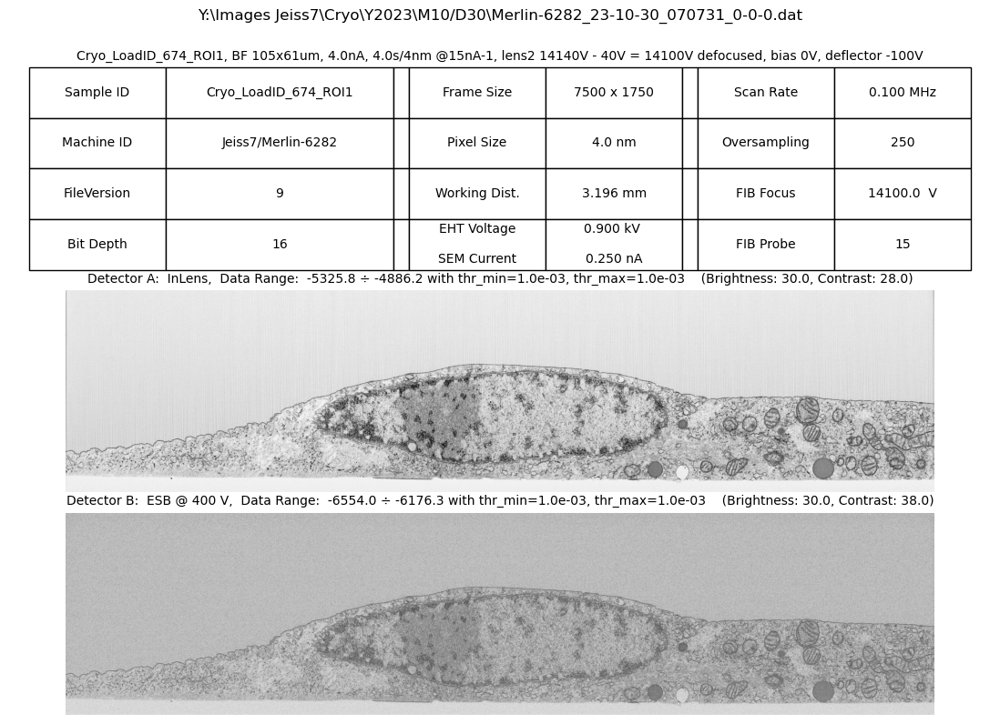

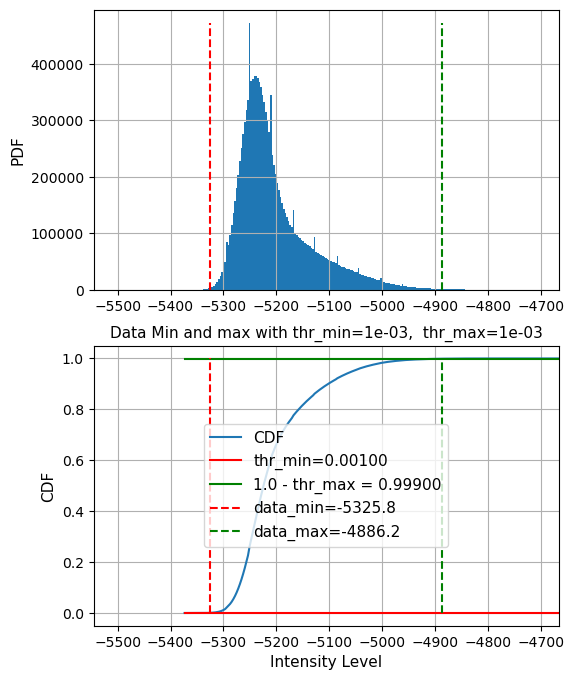

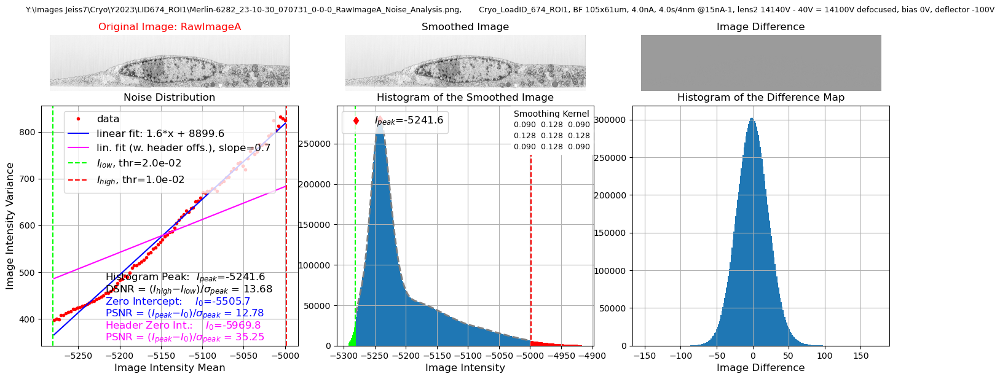

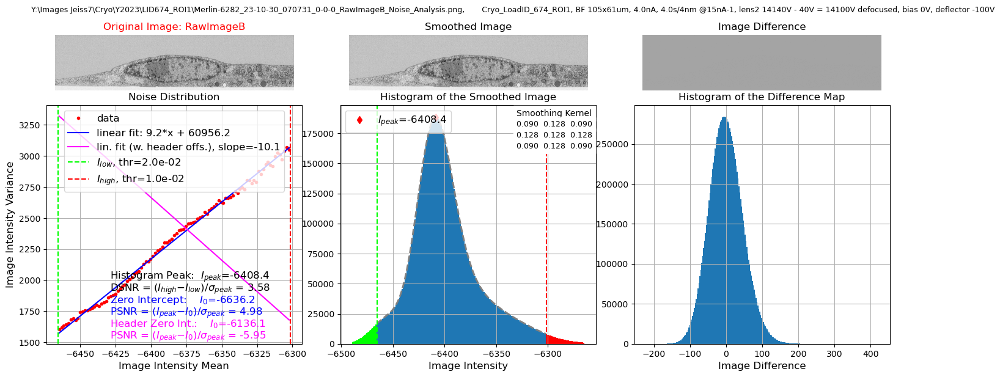

In [6]:
fr_inds = [300]
for fr_ind in fr_inds:
    test_frame = FIBSEM_frame(fls[fr_ind])
    test_frame_suff = Path(test_frame.fname).suffix
    snapshot_name = os.path.join(data_dir, os.path.split(fls[fr_ind])[1].replace(test_frame_suff, '_snapshot.png'))
    test_frame.save_snapshot(snapshot_name=snapshot_name)
    get_min_max_thresholds(test_frame.RawImageA, disp_res=True)
    test_frame.save_images_tif()

    print('header scaling data:', test_frame.Scaling)
    image_name = 'RawImageA'
    res_fname = os.path.join(data_dir, os.path.split(fls[fr_ind])[1].replace(test_frame_suff, '_' + image_name + '_Noise_Analysis.png'))
    RawImageA_results = test_frame.analyze_noise_statistics(image_name=image_name, res_fname = res_fname)
    image_name = 'RawImageB'
    res_fname = os.path.join(data_dir, os.path.split(fls[fr_ind])[1].replace(test_frame_suff, '_' + image_name + '_Noise_Analysis.png'))
    RawImageA_results = test_frame.analyze_noise_statistics(image_name=image_name, res_fname = res_fname)

In [7]:
test_frame.print_header()

FileMagicNum= 3555587570
FileVersion= 9
FileType= 1
SWdate= 01/02/2022
TimeStep= 4e-08
ChanNum= 2
EightBit= 0
Scaling= [[ 2.00000000e+06  2.00000000e+06]
 [-5.96982373e+03 -6.13606152e+03]
 [ 2.28544652e-01  1.47624426e-02]
 [ 1.00000000e-01  1.00000000e-01]]
RestartFlag= 0
StageMove= 0
FirstPixelX= -3750
FirstPixelY= -613
XResolution= 7500
YResolution= 1750
Oversampling= 250
ZeissScanSpeed= 8
DecimatingFactor= 14
SaveOversamples= 0
ScanRate= 100000.0
FramelineRampdownRatio= 0.15000000596046448
Xmin= -1.4142135381698608
Xmax= 1.4142135381698608
Detmin= -10.0
Detmax= 10.0
AI1= 1
AI2= 1
AI3= 0
AI4= 0
Sample_ID= Cryo_LoadID_674_ROI1
Notes= Cryo_LoadID_674_ROI1, BF 105x61um, 4.0nA, 4.0s/4nm @15nA-1, lens2 14140V - 40V = 14100V defocused, bias 0V, deflector -100V                                                                             
SEMShiftX= 0.0
SEMShiftY= 0.0
DetA= InLens    
DetB= ESB @ 400 V       
DetC= Detector C          
DetD= Detector D          
Mag= 762.2109985351562
Pixel

# Check the settings: Perform SIFT alignements on two frames in the middle of the stack

2024/09/16  16:57:12   DASK client does not exist. Will perform local computations
Sample ID:    Cryo_LoadID_674_ROI1
File:  Y:\Images Jeiss7\Cryo\Y2023\M10/D30\Merlin-6282_23-10-30_045318_0-0-0.dat , extracted 118084 keypoints
File:  Y:\Images Jeiss7\Cryo\Y2023\M10/D30\Merlin-6282_23-10-30_045559_0-0-0.dat , extracted 117977 keypoints


Repeating SIFT calculation 1 times:   0%|          | 0/1 [00:00<?, ?it/s]


# of detected matches: 7399

thr_min=1e-03, thr_max=1e-03
RegularizedAffineTransform, RANSAC,  FLANN
SIFT_nfeatures=0
SIFT_nOctaveLayers=3,  SIFT_edgeThreshold=10.000
SIFT_contrastThreshold=0.025,  SIFT_sigma=1.600
RANSAC_initial_fraction = 0.0500, max_iter=1000
# of keypoints = 118084, # of matches =7399
2024/09/16  16:57:41   Transformation Matrix determined using RegularizedAffineTransform using RANSAC solver
[[ 1.00002092e+00 -9.67459436e-06 -3.63876675e-01]
 [ 1.59715167e-05  1.00014439e+00 -5.30386881e-01]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]
7399 keypoint matches were detected with 1.5 pixel outlier threshold
Number of iterations: 1226
Wall time: 29.1 s


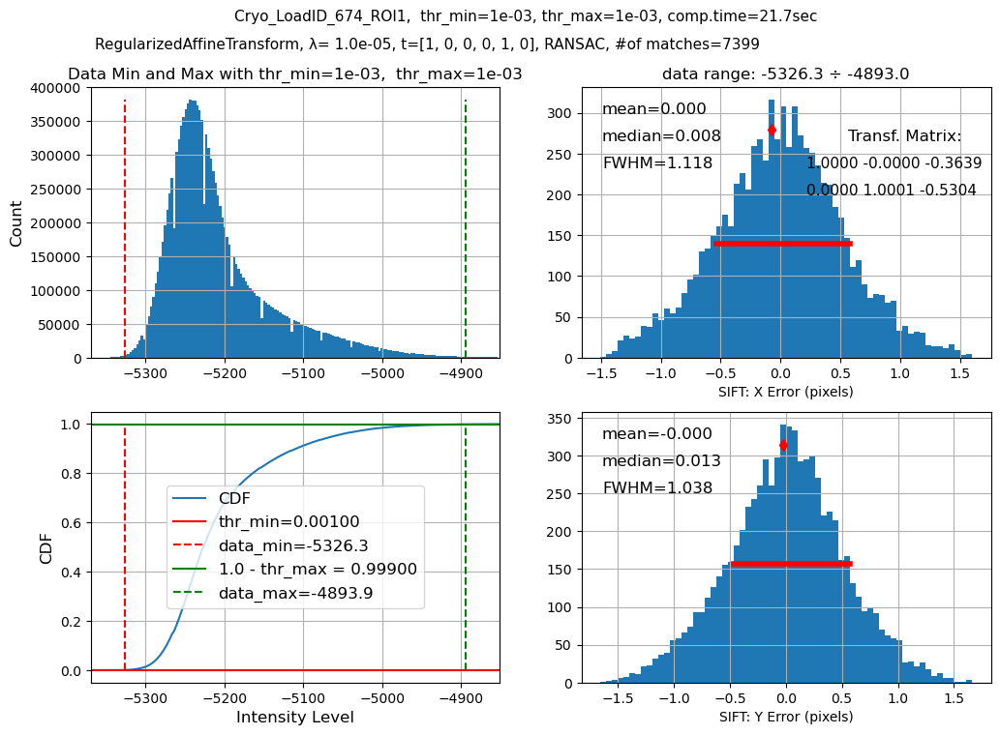

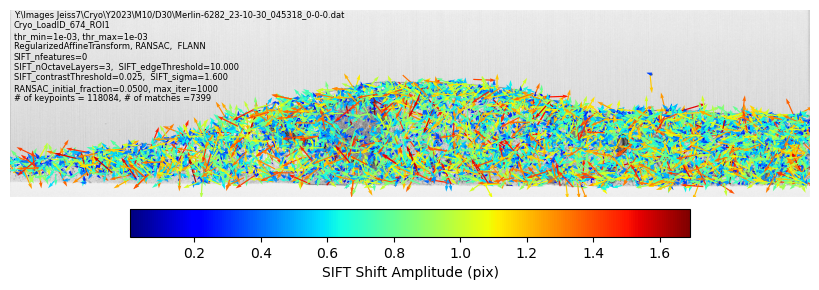

In [8]:
%%time
SIFT_evaluation_results = test_dataset.SIFT_evaluation(RANSAC_initial_fraction=0.05)

Cryo_LoadID_674_ROI1
File:  Y:\Images Jeiss7\Cryo\Y2023\M11/D02\Merlin-6282_23-11-02_180222_0-0-0.dat , extracted 100000 keypoints
File:  Y:\Images Jeiss7\Cryo\Y2023\M11/D02\Merlin-6282_23-11-02_180502_0-0-0.dat , extracted 100000 keypoints
thr_min=1e-03, thr_max=1e-03
RegularizedAffineTransform, RANSAC,  FLANN
kp_max_num=100000,  SIFT_nfeatures=0
SIFT_nOctaveLayers=3,  SIFT_edgeThreshold=10.000
SIFT_contrastThreshold=0.025,  SIFT_sigma=1.600
RANSAC_initial_fraction = 0.0500
# of keypoints = 100000, # of matches =1762
2024/06/18  11:13:12   Transformation Matrix determined using RegularizedAffineTransform using RANSAC solver
[[ 9.99864376e-01 -3.02075827e-04  6.04444001e-01]
 [ 1.56773563e-04  9.99839126e-01 -6.13076491e-01]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]
1762 keypoint matches were detected with 1.5 pixel outlier threshold
Number of iterations: 16174
CPU times: total: 1min 4s
Wall time: 31.1 s


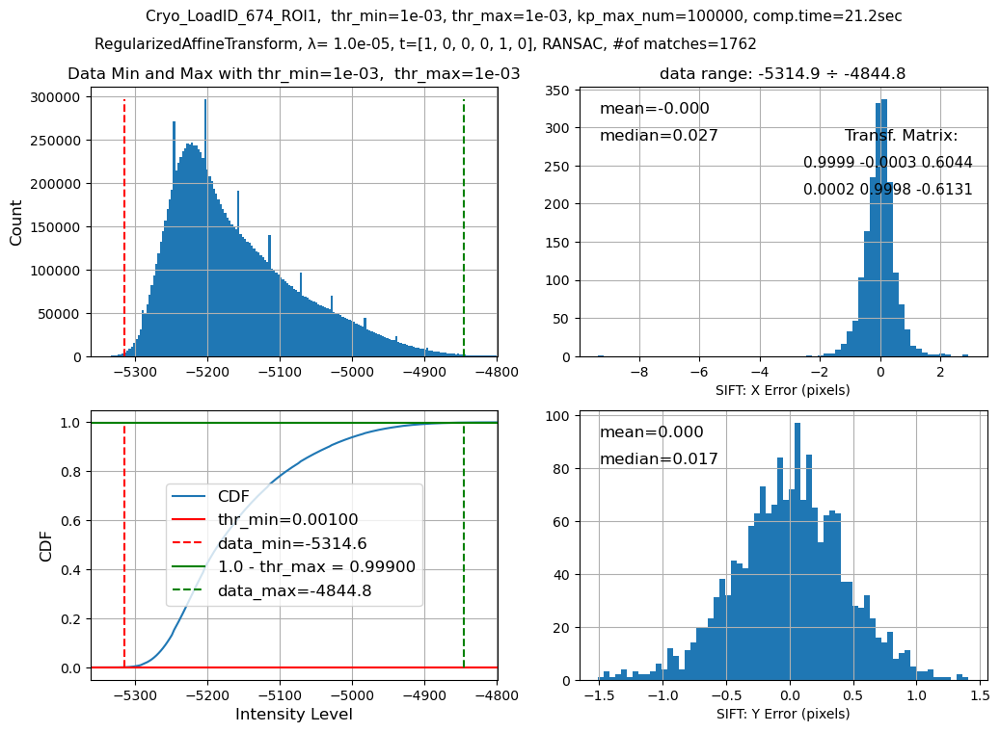

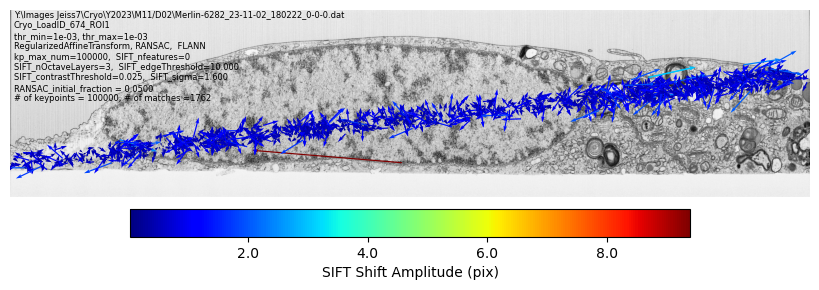

In [8]:
%%time
SIFT_evaluation_results = test_dataset.SIFT_evaluation(RANSAC_initial_fraction=0.05)

2024/09/07  16:07:29   DASK client does not exist. Will perform local computations
Cryo_LoadID_674_ROI1
File:  Y:\Images Jeiss7\Cryo\Y2023\M11/D02\Merlin-6282_23-11-02_180222_0-0-0.dat , extracted 164301 keypoints
File:  Y:\Images Jeiss7\Cryo\Y2023\M11/D02\Merlin-6282_23-11-02_180502_0-0-0.dat , extracted 164126 keypoints


Repeating SIFT calculation 1 times:   0%|          | 0/1 [00:00<?, ?it/s]


# of detected matches: 18609

thr_min=1e-03, thr_max=1e-03
RegularizedAffineTransform, RANSAC,  FLANN
SIFT_nfeatures=0
SIFT_nOctaveLayers=3,  SIFT_edgeThreshold=10.000
SIFT_contrastThreshold=0.025,  SIFT_sigma=1.600
RANSAC_initial_fraction = 0.0050, max_iter=1000
# of keypoints = 164301, # of matches =18609
2024/09/07  16:08:09   Transformation Matrix determined using RegularizedAffineTransform using RANSAC solver
[[ 9.99892187e-01 -1.72838533e-05  3.08656689e-01]
 [ 1.63495084e-04  9.99828033e-01 -5.85734601e-01]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]
18609 keypoint matches were detected with 1.5 pixel outlier threshold
Number of iterations: 1795
Wall time: 39.8 s


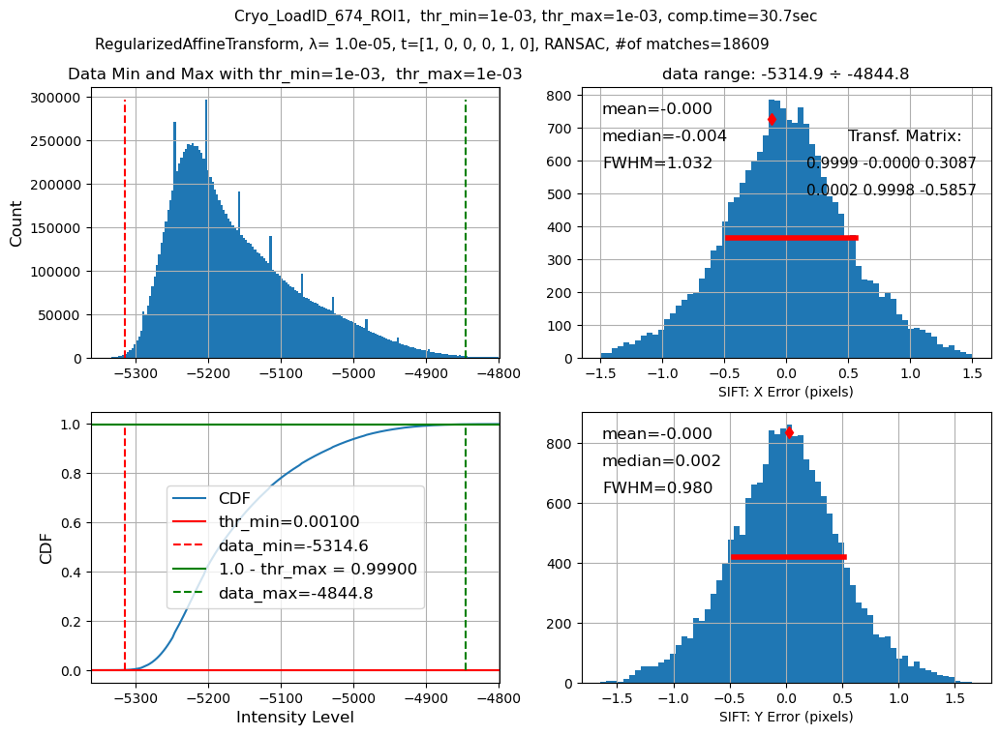

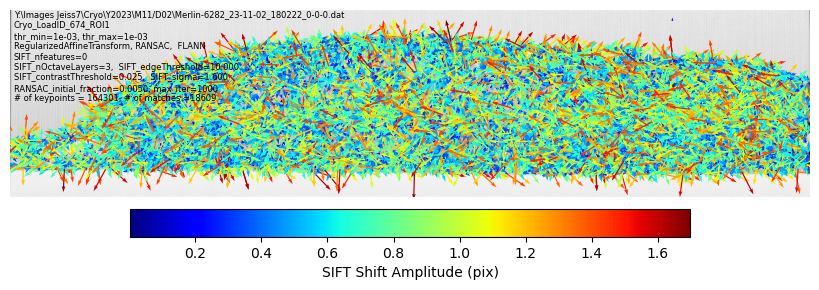

In [9]:
%%time
SIFT_evaluation_results = test_dataset.SIFT_evaluation(RANSAC_initial_fraction=0.005)

# Step 1a. Evaluate Field Flatness and determine Correction Parameters

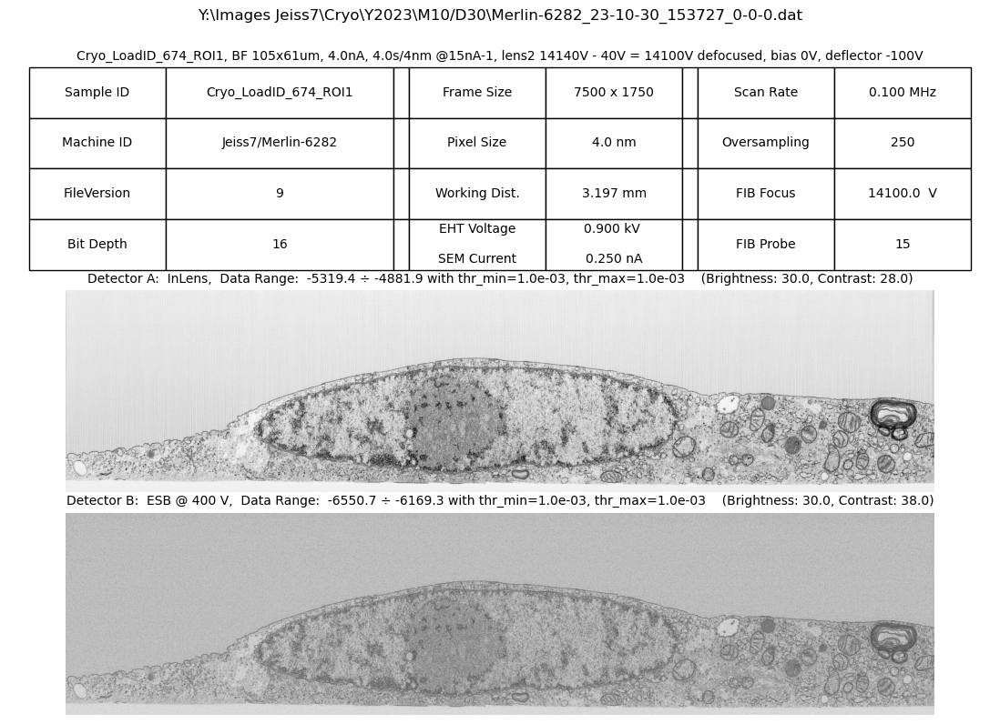

In [9]:
test_frame_ind = -10
test_frame = FIBSEM_frame(fls[test_frame_ind])
test_frame.save_snapshot()

Estimator coefficients 1, x, y, x^2, x y, y^2 :  [ 0.00000000e+00 -3.03570961e-02  3.29630643e-01  4.20429046e-05
  1.74605173e-04  2.01216169e-05]
Estimator intercept:  719.3569545980184
Estimator coefficients 1, x, y, x^2, x y, y^2 :  [ 0.00000000e+00 -1.63871084e-02  1.36602906e-01  3.36337993e-05
 -1.77453638e-04 -1.02214973e-03]
Estimator intercept:  -270.6500386916192
Image Flattening Info saved into the binary file:  Y:\Images Jeiss7\Cryo\Y2023\LID674_ROI1\Merlin-6282_23-10-30_153727_0-0-0_flatfield_corr.bin
Wall time: 5.57 s


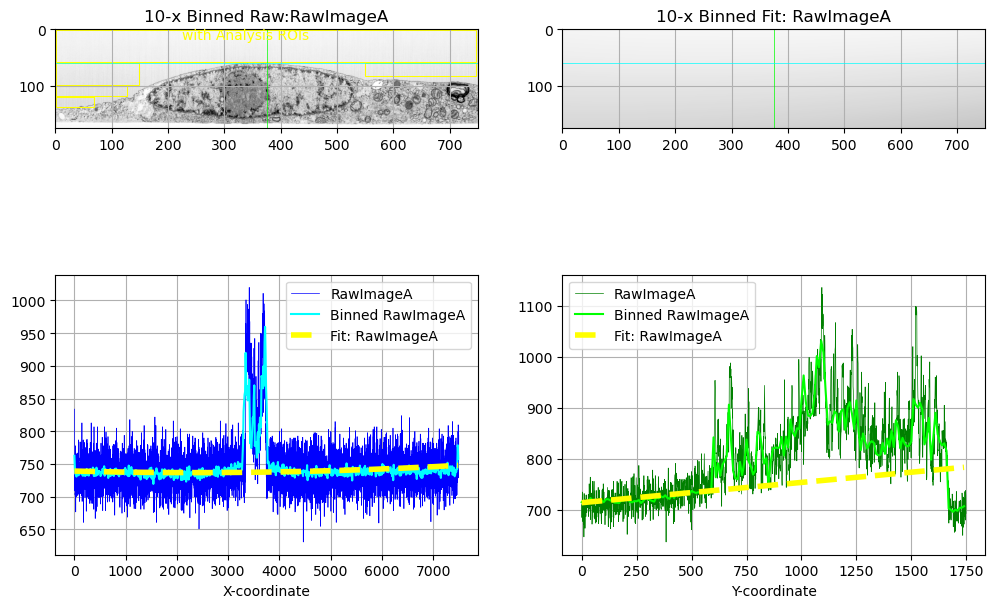

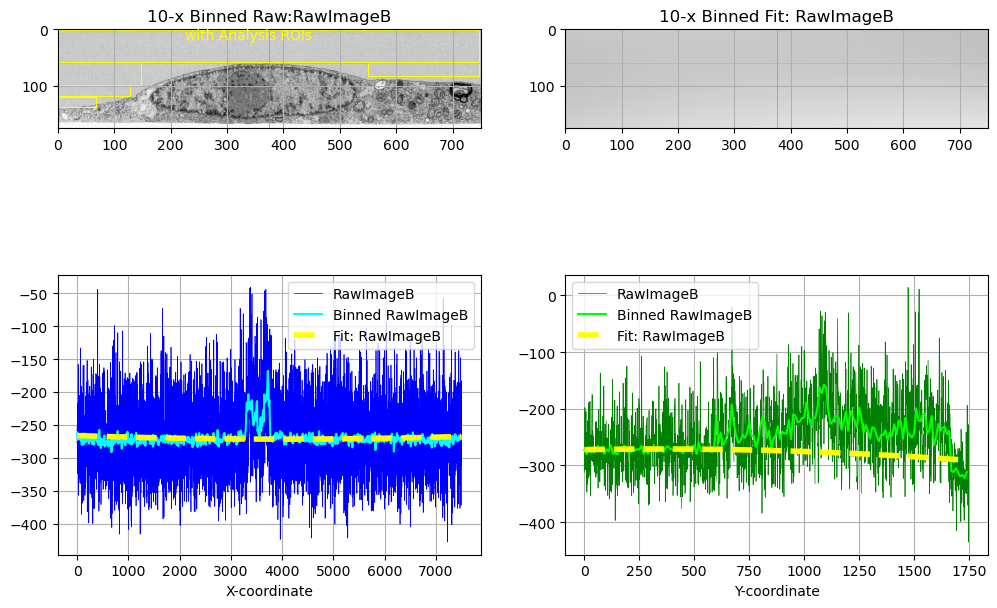

In [14]:
%%time
test_frame_ind = -10
Analysis_ROIs=[[10, 7490, 10, 600],
              [10, 1500, 600, 1000],
               [10, 1300, 1000, 1200],
               [10, 700, 1200, 1400],
              [5500, 7490, 600, 850]]

corr_fname_png = os.path.splitext(os.path.split(fls[test_frame_ind])[1])[0] + '_flatfield_corr.png'
res_fname = os.path.join(data_dir, corr_fname_png)
flattening_params = test_frame.determine_field_fattening_parameters(image_names = ['RawImageA', 'RawImageB'],
                                                                     estimator = RANSACRegressor(),
                                                                     bins=10, Analysis_ROIs=Analysis_ROIs,
                                                                    Ysect=600,
                                                                     calc_corr=True, save_correction_binary=True,
                                                                   res_fname = res_fname)

# Step 1b. Test Image Correction (Flattening)


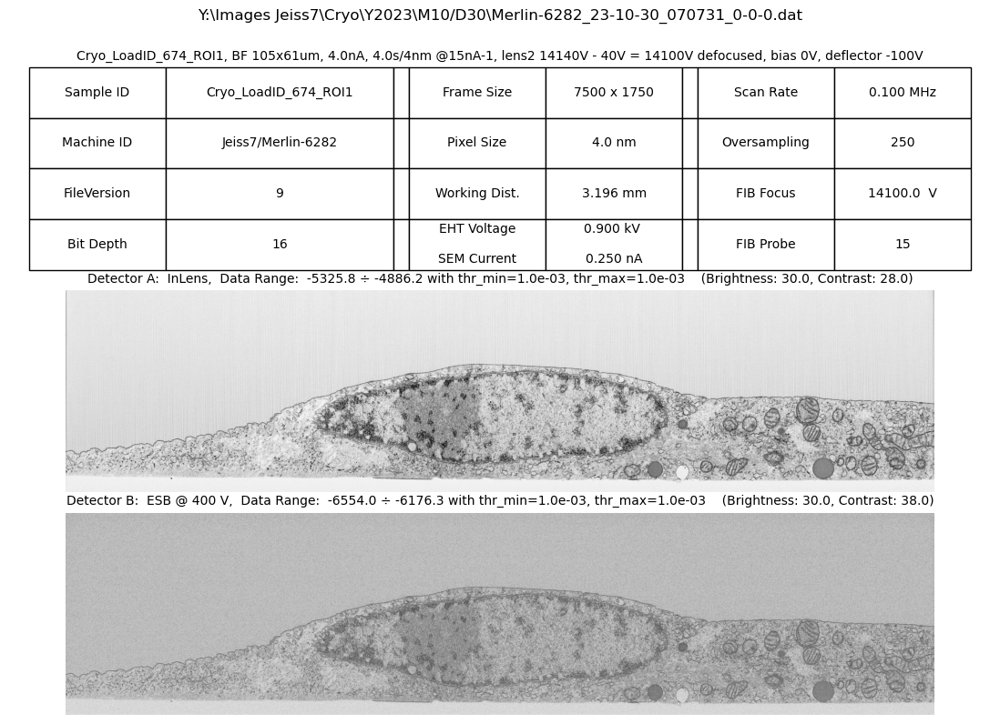

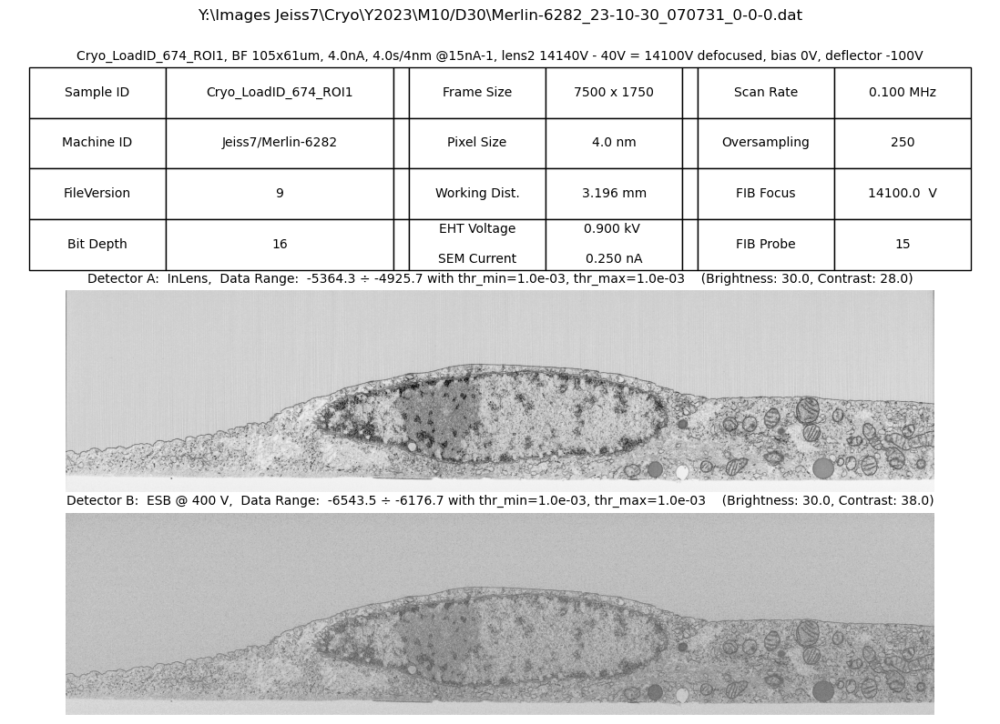

In [15]:
# test image correction
fr_ind = 300
eval_frame = FIBSEM_frame(fls[fr_ind])
orig_snapshot_name = os.path.join(data_dir, os.path.split(fls[fr_ind])[1].replace('.dat', '_original_snapshot.png'))
eval_frame.save_snapshot(snapshot_name = orig_snapshot_name)
flattened_snapshot_name = os.path.join(data_dir, os.path.split(fls[fr_ind])[1].replace('.dat', '_flattened_snapshot.png'))
eval_frame.RawImageA, eval_frame.RawImageB = eval_frame.flatten_image(image_correction_file = test_frame.image_correction_file)
eval_frame.save_snapshot(snapshot_name = flattened_snapshot_name)

In [16]:
# if all is good - assign the image correction file to the test_dataset object
test_dataset.image_correction_file = test_frame.image_correction_file

# This is where the data processing begins. Perform SIFT Computations using DASK Distributed (local cluster, using SCATTER, MAP and GATHER)

# Step 2: Save InLens.tif Data (Optional)

In [12]:
if save_data_as_tiff:
    test_dataset.convert_raw_data_to_tif_files(client)

# Step 2b: Step 2b: Evaluate parameters of FIBSEM data set (Data Min/Max, Working Distance, Milling Y Voltage, FOV center positions)

DASK client exists. Will perform distributed computations
Use http://localhost:51366/status to monitor DASK progress
Evaluating the parameters of FIBSEM data set (data Min/Max, Working Distance, Milling Y Voltage, FOV center positions, Scan Rate, EHT)
2024/09/10  10:43:20   Using DASK distributed
Using fit_params:  SG 11 3
2024/09/10  10:44:46   Saving the FIBSEM dataset statistics (Min/Max, Mill Rate, FOV Shifts into the file:  Y:\Images Jeiss7\Cryo\Y2023\LID674_ROI1\FIBSEM_Data.xlsx
Z pixel = 4.71 nm  - based on WD data
Z pixel = 3.81 nm  - based on Milling Voltage data
Using fit_params:  SG 11 3
Wall time: 1min 32s


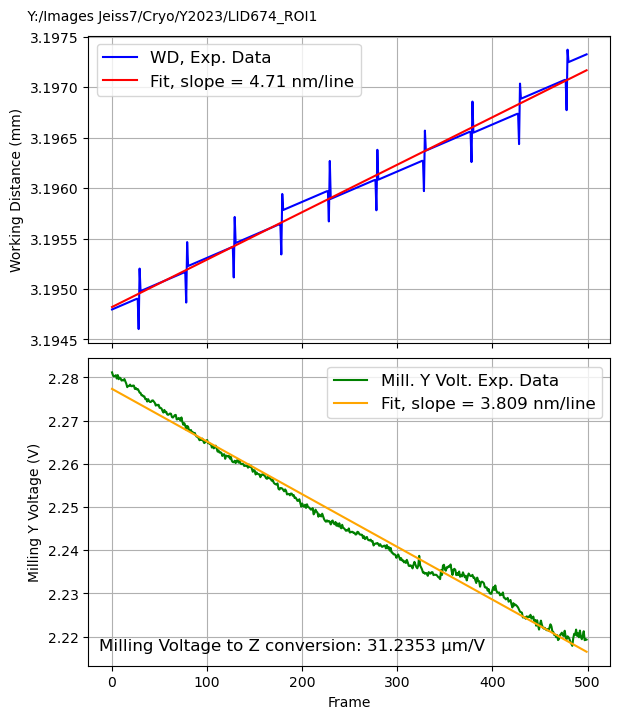

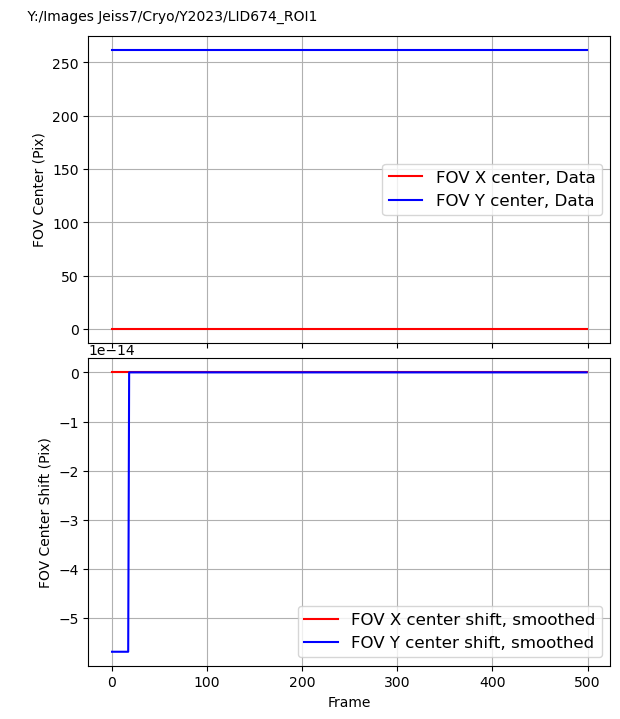

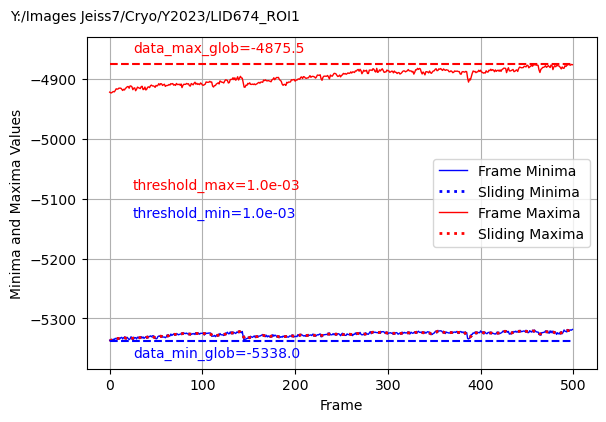

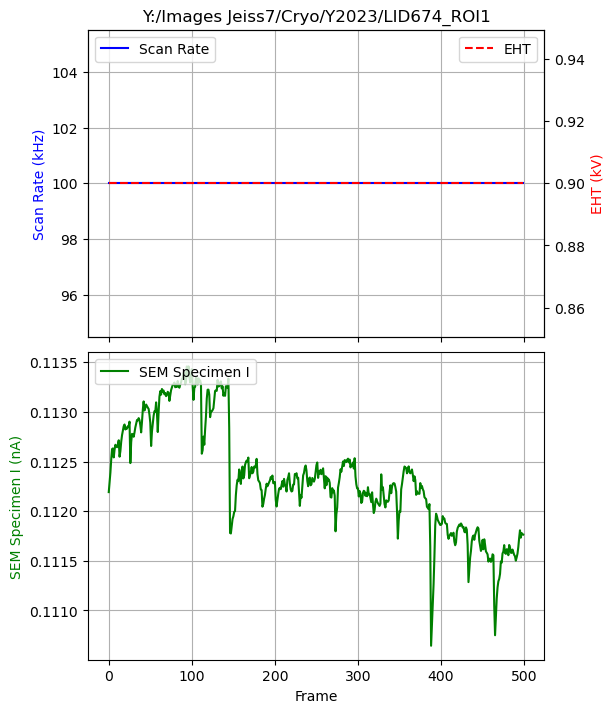

In [19]:
%%time
FIBSEM_Data = test_dataset.evaluate_FIBSEM_statistics(DASK_client = client,
                                                      fit_params = ['SG', 11, 3])
generate_report_mill_rate_xlsx(FIBSEM_Data[0])
generate_report_FOV_center_shift_xlsx(FIBSEM_Data[0])
generate_report_data_minmax_xlsx(FIBSEM_Data[0])
generate_report_ScanRate_EHT_xlsx(FIBSEM_Data[0])

# There was an annoying SEM current drop - will need to rescale the data to correct for that.

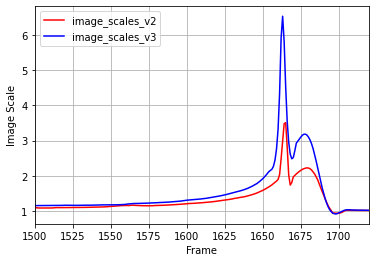

In [15]:
DarkA = -5969.8
DarkB = -6649.7
ImgB_fraction=0.08

SEMSpecimenI = test_dataset.FIBSEM_Data[11]
DataMin_scale = test_dataset.FIBSEM_Data[3]-DarkA

image_scales_v2 = np.mean(SEMSpecimenI)/SEMSpecimenI
image_scales_v3 = np.mean(DataMin_scale)/DataMin_scale

fig, ax = plt.subplots(1,1, figsize = (6, 4))
ax.plot(image_scales_v2, 'r', label = 'image_scales_v2')
ax.plot(image_scales_v3, 'b', label = 'image_scales_v3')
ax.set_xlabel('Frame')
ax.set_xlim((1500, 1720))
ax.set_ylabel('Image Scale')
ax.grid(True)
ax.legend()

image_offs = DarkA*(1.0-ImgB_fraction) + DarkB*ImgB_fraction
image_offsets = image_scales_v2*0.0 + image_offs

# Steps 3 and 4: Extract Key Points and Descriptors, Find Matches and Transformations

Step 3: Extract Key Points and Descriptors
DASK client exists. Will perform distributed computations
Use http://localhost:51366/status to monitor DASK progress
2024/09/10  10:50:18   Using DASK distributed
Step 3: Elapsed time: 778.89 seconds

Step 4: Select Good Matches with FLANN matcher
Step 4: using RegularizedAffineTransform Transformation Model with RANSAC solver
Step 4: RegularizedAffineTransform parameters:
Step 4: Regularization matrix: 
[[1.e-05 0.e+00 0.e+00 0.e+00 0.e+00 0.e+00]
 [0.e+00 1.e-05 0.e+00 0.e+00 0.e+00 0.e+00]
 [0.e+00 0.e+00 0.e+00 0.e+00 0.e+00 0.e+00]
 [0.e+00 0.e+00 0.e+00 1.e-05 0.e+00 0.e+00]
 [0.e+00 0.e+00 0.e+00 0.e+00 1.e-05 0.e+00]
 [0.e+00 0.e+00 0.e+00 0.e+00 0.e+00 0.e+00]]
Step 4: Target Solution:  [1 0 0 0 1 0]
DASK client exists. Will perform distributed computations
Use http://localhost:51366/status to monitor DASK progress
2024/09/10  11:03:17   Using DASK distributed
Mean Number of Keypoints : 8493
Step 4: Elapsed time: 642.87 seconds


Calculating Cummilative Transformation Matrix:   0%|          | 0/499 [00:00<?, ?it/s]

Recalculating the shifts for preserved scales:   0%|          | 0/499 [00:00<?, ?it/s]

Wall time: 24min 4s


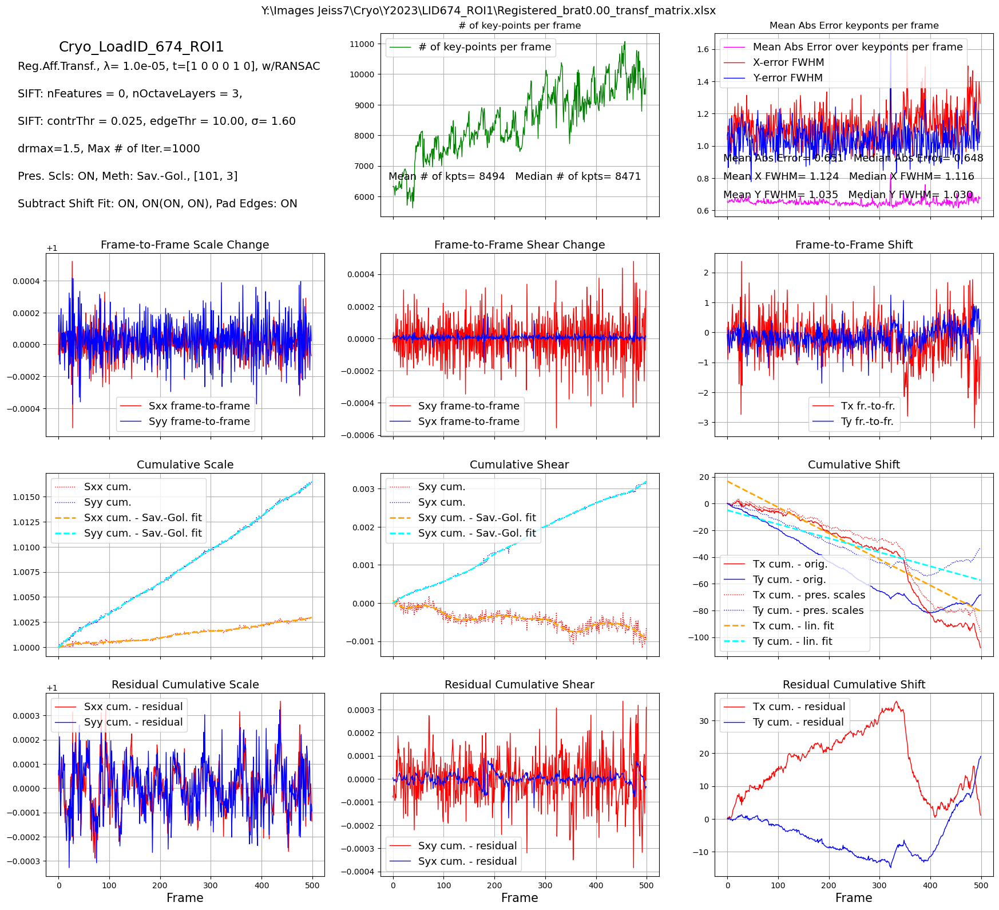

In [20]:
%%time
# Step 3: Extract Key Points and Descriptors using DASK Distributed
t1 = time.time()
print('Step 3: Extract Key Points and Descriptors')
fnms = test_dataset.extract_keypoints(DASK_client = client)   
t2 = time.time()
print('Step 3: Elapsed time: {:.2f} seconds'.format(t2 - t1))
print('')

# Step 4: Select good matches and extract transformation parameters using DASK Distributed
matcher_str = 'BF' if BFMatcher else 'FLANN'
print('Step 4: Select Good Matches with ' + matcher_str + ' matcher')
print('Step 4: using ' + test_dataset.TransformType.__name__ + ' Transformation Model with ' + solver + ' solver')
if test_dataset.TransformType == RegularizedAffineTransform:
    print('Step 4: ' + test_dataset.TransformType.__name__ + ' parameters:')
    print('Step 4: Regularization matrix: ')
    print(test_dataset.l2_matrix)
    print('Step 4: Target Solution: ', test_dataset.targ_vector)

results_s4 = test_dataset.determine_transformations(DASK_client = client)
t3 = time.time()
print('Step 4: Elapsed time: {:.2f} seconds'.format(t3 - t2))

tr_matr_cum_residual, tr_matr_cum_xlsx_file = test_dataset.process_transformation_matrix()
generate_report_transf_matrix_from_xlsx(tr_matr_cum_xlsx_file)

In [21]:
# here is an example of how the previous step can be modified easily without having to re-do all previous steps
# this will calculate the cumulative transformation matrix WITHOT modifying the object property subtract_linear_fit
# so this change will NOT propagate.
# tr_matr_cum_residual = test_dataset.process_transformation_matrix(subtract_linear_fit = [False, True])

# if you want to make permanet change, then you should do this:
# test_dataset.subtract_linear_fit = [False, True]
# tr_matr_cum_residual = test_dataset.process_transformation_matrix()


# Step 5: Search for frames with no (or low # of) matches and possibly remove them.

In [22]:
thr_npt = 3   # consider frame with less than 3 Key Points for removal
tr_matr_cum_residual = test_dataset.check_for_nomatch_frames(thr_npt, **SIFT_kwargs)

Frames with no matches to the next frame:   []
Frames to remove:   []
No frames selected for removal


# Step 6: Recall or Save the Intermediate Data (KeyPoints, Matches, Transf.Matrix, etc.) from / into spreadsheets and a binary files.  Remove the intermediate KeyPoint/Descriptor files.

In [23]:
recall_the_data = False          # if False, the data will be saved. if True, the data will be recalled

dump_filename = os.path.join(data_dir, test_dataset.fnm_reg.replace('.mrc', '_params.bin'))

if recall_the_data:
    test_dataset = FIBSEM_dataset(fls, recall_parameters=True, dump_filename=dump_filename, disp_res=True, **SIFT_kwargs)
else:
    saved_dump_file = test_dataset.save_parameters(dump_file=dump_filename)
    print('Parameters saved into the file: ', saved_dump_file)

Parameters saved into the file:  Y:\Images Jeiss7\Cryo\Y2023\LID674_ROI1\Registered_brat0.00_params.bin


In [24]:
remove_key_points_data = True   # if True, the binary files with intermediate keypoints data for each frame will be removed

# Remove temporary files
if remove_key_points_data:
    # Remove the keypoint/ descriptor files
    for fnm in tqdm(test_dataset.fnms, desc='Removing KeyPoint/Descriptor Files: '):
        try:
            os.remove(os.path.join(data_dir, fnm))
        except:
            pass
    for fnm in tqdm(test_dataset.fnms_matches, desc='Removing Matched KeyPoint Files: '):
        try:
            os.remove(os.path.join(data_dir, fnm))
        except:
            pass

Removing KeyPoint/Descriptor Files:   0%|          | 0/500 [00:00<?, ?it/s]

Removing Matched KeyPoint Files:   0%|          | 0/499 [00:00<?, ?it/s]

# Define Evaluation Box

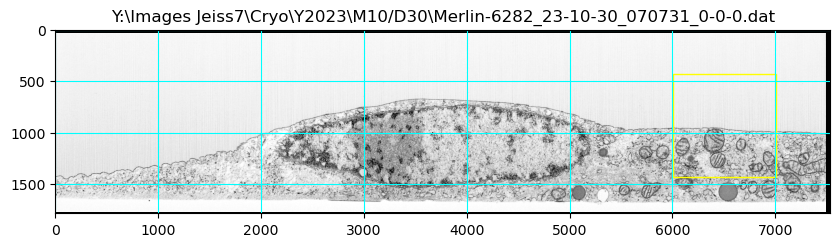

In [26]:
#evaluation_box = [250, 2000, 1450, 2650]      # optional evaluation box for defining the area over which the registration quality
#test_dataset.show_eval_box(evaluation_box = evaluation_box, invert_data=False)
#
# default frames are three frames: 10% from the start, 50% from the start, and 90% from the start
# alternatively you can set any list of frame indecis by using keyword frame_indices
# for example:0
# test_dataset.show_eval_box(frame_indices=[1, 100, 850], evaluation_box = evaluation_box, invert_data=False)
#
fr_ind = 300
evaluation_box = [400, 1000, 6000, 1000]
xx = test_dataset.show_eval_box(invert_data=False, frame_inds=[fr_ind], evaluation_box=evaluation_box, fill_value=-10.00)

# Evaluate Image B fraction for fused image using Auto-Correlation and Cross-Correlation

Analyzing Auto-Correlation SNRs :   0%|          | 0/1 [00:00<?, ?it/s]

2024/09/10  11:16:15   Saved the results into the file:  Y:\Images Jeiss7\Cryo\Y2023\LID674_ROI1\Merlin-6282_23-10-30_070731_0-0-0_ImgA_SNR.png
2024/09/10  11:16:18   Saved the results into the file:  Y:\Images Jeiss7\Cryo\Y2023\LID674_ROI1\Merlin-6282_23-10-30_070731_0-0-0_ImgB_SNR.png


Re-analyzing Auto-Correlation SNRs for fused image:   0%|          | 0/1 [00:00<?, ?it/s]

2024/09/10  11:16:21   Saved the results into the file:  Y:\Images Jeiss7\Cryo\Y2023\LID674_ROI1\Merlin-6282_23-10-30_070731_0-0-0_ImgB_fr0.036_SNR.png
Wall time: 9.24 s


(0.03975873009442309, 0.03751750499727298, 0.03593776546164051)

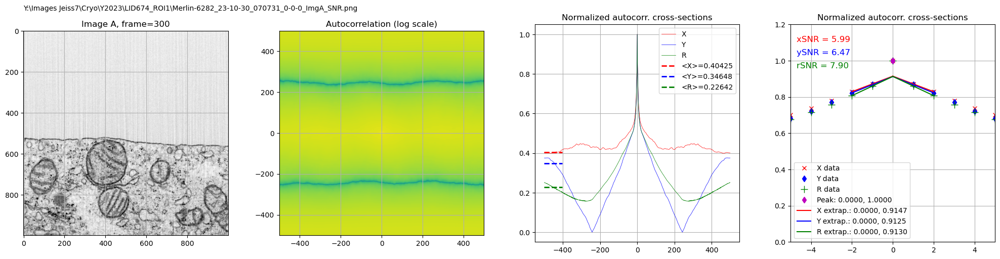

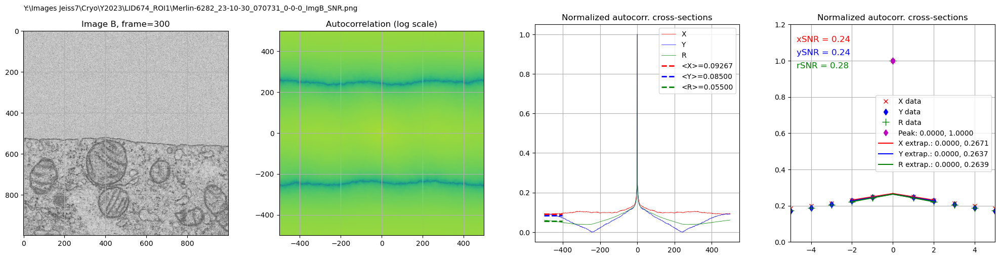

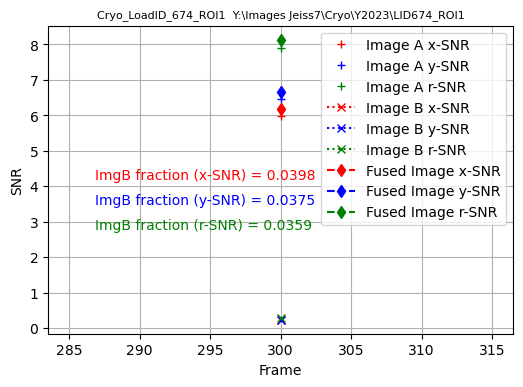

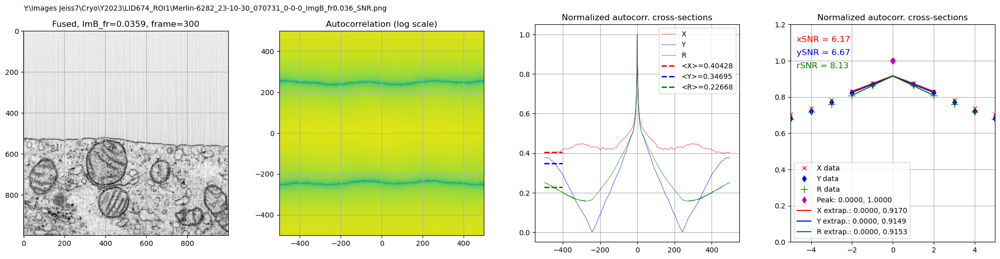

In [27]:
%%time
fr_ind = 300
evaluation_box = [400, 1000, 6000, 1000]
test_dataset.estimate_SNRs(frame_inds=[fr_ind],
                           #ImgB_fraction = 0.08,
                           perform_transformation = False,
                           evaluation_box = evaluation_box, save_res_png=True)

DASK client exists. Will perform distributed computations
Use http://localhost:51366/status to monitor DASK progress


Evaluating Img B fractions:   0%|          | 0/11 [00:00<?, ?it/s]

DASK client exists. Will perform distributed computations
Use http://localhost:51366/status to monitor DASK progress
DASK client exists. Will perform distributed computations
Use http://localhost:51366/status to monitor DASK progress
DASK client exists. Will perform distributed computations
Use http://localhost:51366/status to monitor DASK progress
DASK client exists. Will perform distributed computations
Use http://localhost:51366/status to monitor DASK progress
DASK client exists. Will perform distributed computations
Use http://localhost:51366/status to monitor DASK progress
DASK client exists. Will perform distributed computations
Use http://localhost:51366/status to monitor DASK progress
DASK client exists. Will perform distributed computations
Use http://localhost:51366/status to monitor DASK progress
DASK client exists. Will perform distributed computations
Use http://localhost:51366/status to monitor DASK progress
DASK client exists. Will perform distributed computations
Use ht

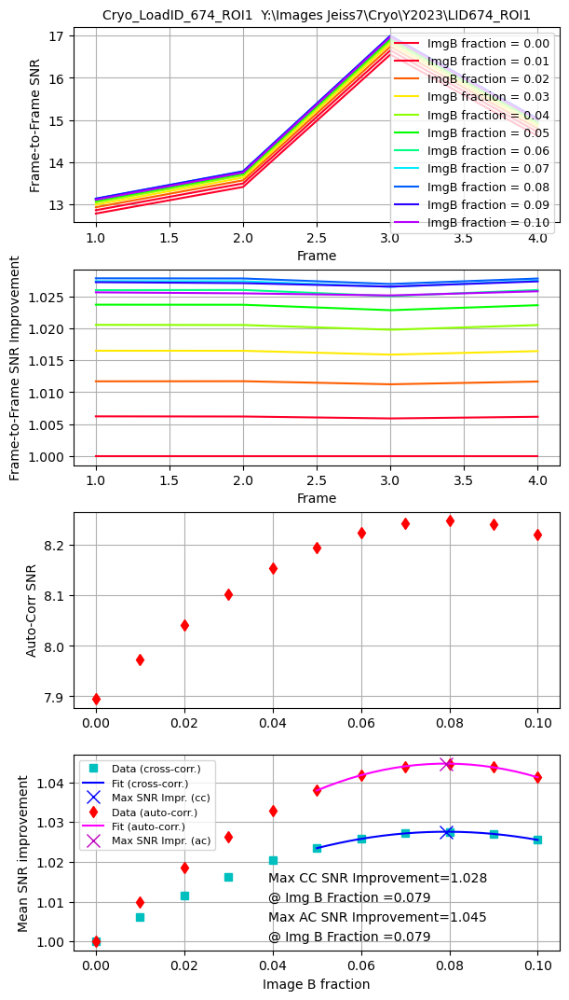

In [28]:
%%time
evaluation_box = [400, 1000, 6000, 1000]
frame_inds = 300 + np.arange(5)
ImgB_fractions = np.linspace(0.00, 0.10, 11)
ImgB_fr_optimal_mid = test_dataset.evaluate_ImgB_fractions(ImgB_fractions, frame_inds,
                                                           DASK_client=client,
                                                           evaluation_box = evaluation_box)

# Step 7: Transform and Save the FIB-SEM data

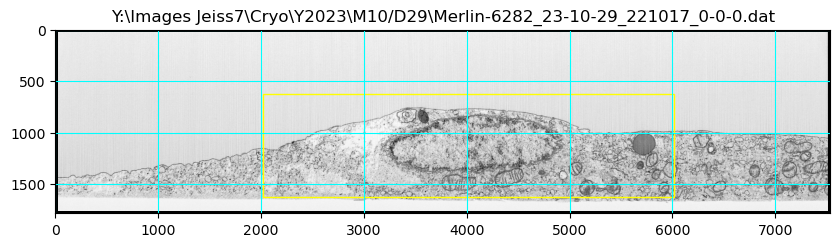

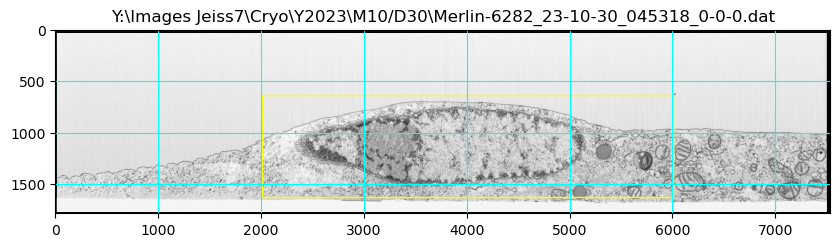

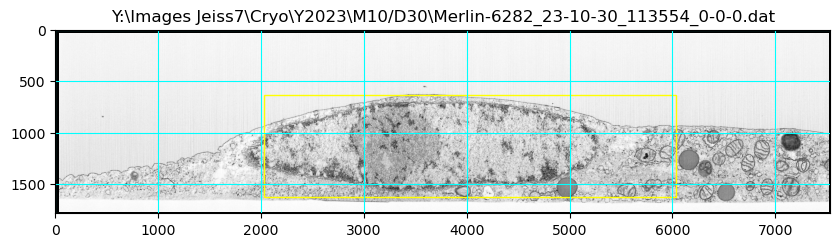

In [29]:
evaluation_box = [600, 1000, 2000, 4000]
test_dataset.show_eval_box(invert_data=False,
                           frame_inds = [nfrs//5, nfrs//2, nfrs//5*4],
                           evaluation_box=evaluation_box)

Step 7: Transform and Save the FIB-SEM data
DASK client exists. Will perform distributed computations
Use http://localhost:51366/status to monitor DASK progress
Transforming and Saving Intermediate Registered Frames
2024/09/10  11:17:57   Transform and Save Chunks of Frames: Starting DASK jobs
2024/09/10  11:20:22   Finished DASK jobs
Analyzing Registration Quality
2024/09/10  11:20:23   Analyzing Frame Registration: Starting DASK jobs
2024/09/10  11:21:36   Finished DASK jobs
2024/09/10  11:21:49   Saving the Registration Quality Statistics into the file:  Y:\Images Jeiss7\Cryo\Y2023\LID674_ROI1\LID674_ROI1_RegAffine_l2_1e-05_brat0.00_RegistrationQuality.xlsx
Registered data set is NOT saved into a file


Removing Intermediate Registered Frame Files:   0%|          | 0/500 [00:00<?, ?it/s]

Wall time: 4min 7s


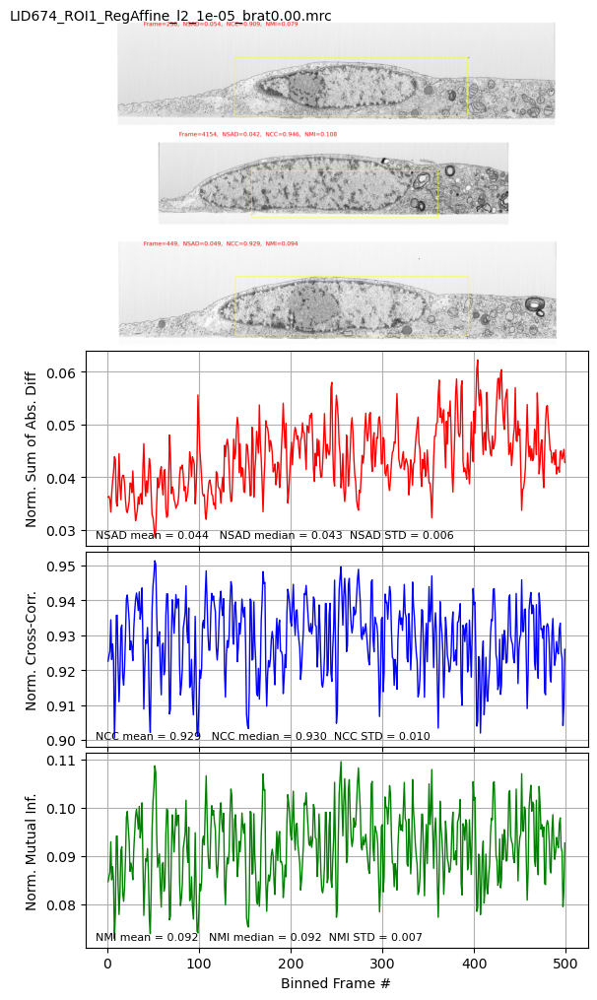

In [30]:
%%time

print('Step 7: Transform and Save the FIB-SEM data')

test_dataset.fnm_reg = 'LID674_ROI1_RegAffine_l2_1e-05_brat0.00.mrc'

evaluation_box = [600, 1000, 2000, 4000]

reg_summary_RegAffine_ImB0p00, reg_summary_RegAffine_ImB0p00_xlsx = test_dataset.transform_and_save(DASK_client = client,
                                                        save_transformed_dataset = False,
                                                        save_registration_summary = True,
                                                        flatten_image = False,
                                                        ImgB_fraction=0.00,
                                                        add_offset = True,
                                                        zbin_factor = 1,
                                                        evaluation_box = evaluation_box,
                                                        sliding_evaluation_box = False,
                                                        fnm_types = ['mrc'])

generate_report_from_xls_registration_summary(reg_summary_RegAffine_ImB0p00_xlsx)

Step 7: Transform and Save the FIB-SEM data
DASK client exists. Will perform distributed computations
Use http://localhost:63250/status to monitor DASK progress
Transforming and Saving Intermediate Registered Frames
2024/05/17  22:35:24   Transform and Save Chunks of Frames: Starting DASK jobs
2024/05/17  23:29:09   Finished DASK jobs
Analyzing Registration Quality
2024/05/17  23:29:13   Analyzing Frame Registration: Starting DASK jobs
2024/05/17  23:45:23   Finished DASK jobs
2024/05/17  23:45:37   Saving the Registration Quality Statistics into the file:  Y:\Images Jeiss7\Cryo\Y2023\LID674_ROI1\LID674_ROI1_RegAffine_l2_1e-05_brat0.00_flattened_RegistrationQuality.xlsx
Registered data set is NOT saved into a file


Removing Intermediate Registered Frame Files:   0%|          | 0/8309 [00:00<?, ?it/s]

Wall time: 1h 14min 54s


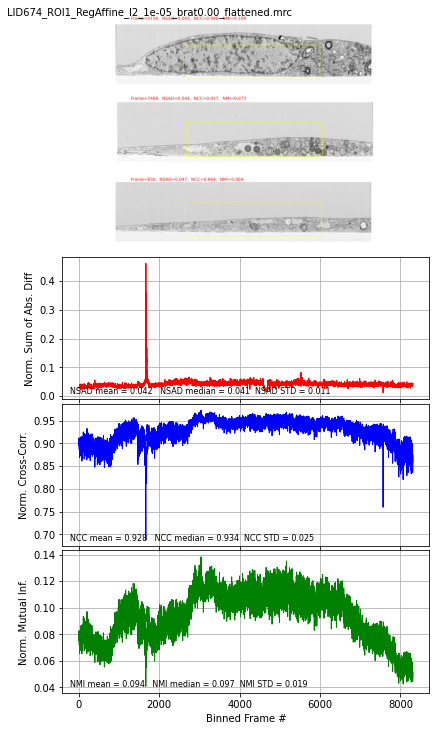

In [26]:
%%time

print('Step 7: Transform and Save the FIB-SEM data')

test_dataset.fnm_reg = 'LID674_ROI1_RegAffine_l2_1e-05_brat0.00_flattened.mrc'

evaluation_box = [600, 1000, 2000, 4000]

reg_summary_RegAffine_ImB0p00_flattened, reg_summary_RegAffine_ImB0p00_flattened_xlsx = test_dataset.transform_and_save(DASK_client = client,
                                                        save_transformed_dataset = False,
                                                        save_registration_summary = True,
                                                        flatten_image = True,
                                                        ImgB_fraction=0.00,
                                                        add_offset = True,
                                                        zbin_factor = 1,
                                                        evaluation_box = evaluation_box,
                                                        sliding_evaluation_box = False,
                                                        fnm_types = ['mrc'])

generate_report_from_xls_registration_summary(reg_summary_RegAffine_ImB0p00_flattened_xlsx)

Step 7: Transform and Save the FIB-SEM data
DASK client exists. Will perform distributed computations
Use http://localhost:63250/status to monitor DASK progress
Transforming and Saving Intermediate Registered Frames
2024/05/17  23:50:21   Transform and Save Chunks of Frames: Starting DASK jobs
2024/05/18  00:48:25   Finished DASK jobs
Analyzing Registration Quality
2024/05/18  00:48:28   Analyzing Frame Registration: Starting DASK jobs
2024/05/18  01:05:01   Finished DASK jobs
2024/05/18  01:05:13   Saving the Registration Quality Statistics into the file:  Y:\Images Jeiss7\Cryo\Y2023\LID674_ROI1\LID674_ROI1_RegAffine_l2_1e-05_brat0.08_flattened_RegistrationQuality.xlsx
Creating Dask Array Stack
The resulting stack shape will be  nx=7686, ny=2229, nz=8309,  data type: <class 'numpy.int16'>
Voxel Size (nm): 3.999928 x 3.999928 x 4.026198
2024/05/18  01:05:20   Saving dataset into MRC file:  Y:\Images Jeiss7\Cryo\Y2023\LID674_ROI1\LID674_ROI1_RegAffine_l2_1e-05_brat0.08_flattened.mrc


Saving Frames into MRC File:   0%|          | 0/8309 [00:00<?, ?it/s]

Removing Intermediate Registered Frame Files:   0%|          | 0/8309 [00:00<?, ?it/s]

Wall time: 4h 43min 18s


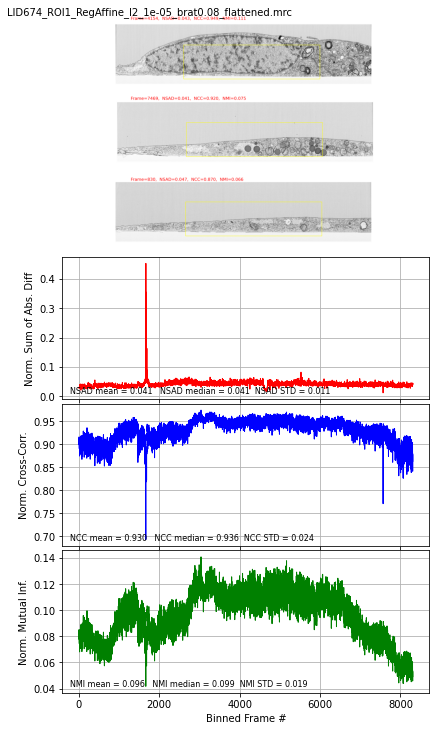

In [27]:
%%time

print('Step 7: Transform and Save the FIB-SEM data')

test_dataset.fnm_reg = 'LID674_ROI1_RegAffine_l2_1e-05_brat0.08_flattened.mrc'

evaluation_box = [600, 1000, 2000, 4000]

reg_summary_RegAffine_ImB0p08_flattened, reg_summary_RegAffine_ImB0p08_flattened_xlsx = test_dataset.transform_and_save(DASK_client = client,
                                                        save_transformed_dataset = True,
                                                        save_registration_summary = True,
                                                        flatten_image = True,
                                                        ImgB_fraction=0.08,
                                                        add_offset = True,
                                                        zbin_factor = 1,
                                                        evaluation_box = evaluation_box,
                                                        sliding_evaluation_box = False,
                                                        fnm_types = ['mrc'])

generate_report_from_xls_registration_summary(reg_summary_RegAffine_ImB0p08_flattened_xlsx)

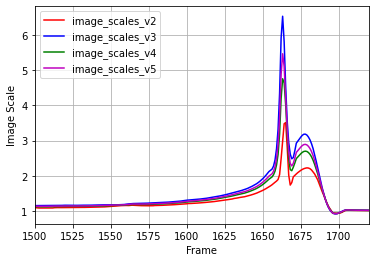

In [28]:
fig, ax = plt.subplots(1,1, figsize = (6, 4))
ax.plot(image_scales_v2, 'r', label = 'image_scales_v2')
ax.plot(image_scales_v3, 'b', label = 'image_scales_v3')
wt4 = 0.5
image_scales_v4 = wt4 * image_scales_v2 + (1-wt4)*image_scales_v3
ax.plot(image_scales_v4, 'g', label = 'image_scales_v4')
wt5 = 0.3
image_scales_v5 = wt5 * image_scales_v2 + (1-wt5)*image_scales_v3
ax.plot(image_scales_v5, 'm', label = 'image_scales_v5')
ax.set_xlabel('Frame')
ax.set_xlim((1500, 1720))
ax.set_ylabel('Image Scale')
ax.grid(True)
ax.legend()

Step 7: Transform and Save the FIB-SEM data
DASK client exists. Will perform distributed computations
Use http://localhost:63250/status to monitor DASK progress
Transforming and Saving Intermediate Registered Frames
2024/05/18  05:00:49   Transform and Save Chunks of Frames: Starting DASK jobs
2024/05/18  05:59:04   Finished DASK jobs
Analyzing Registration Quality
2024/05/18  05:59:07   Analyzing Frame Registration: Starting DASK jobs
2024/05/18  06:15:21   Finished DASK jobs
2024/05/18  06:15:33   Saving the Registration Quality Statistics into the file:  Y:\Images Jeiss7\Cryo\Y2023\LID674_ROI1\LID674_ROI1_RegAffine_l2_1e-05_brat0.08_flattened_v5_RegistrationQuality.xlsx
Creating Dask Array Stack
The resulting stack shape will be  nx=7686, ny=2229, nz=8309,  data type: <class 'numpy.int16'>
Voxel Size (nm): 3.999928 x 3.999928 x 4.026198
2024/05/18  06:15:41   Saving dataset into MRC file:  Y:\Images Jeiss7\Cryo\Y2023\LID674_ROI1\LID674_ROI1_RegAffine_l2_1e-05_brat0.08_flattened_v5.m

Saving Frames into MRC File:   0%|          | 0/8309 [00:00<?, ?it/s]

Removing Intermediate Registered Frame Files:   0%|          | 0/8309 [00:00<?, ?it/s]

Wall time: 4h 42min 19s


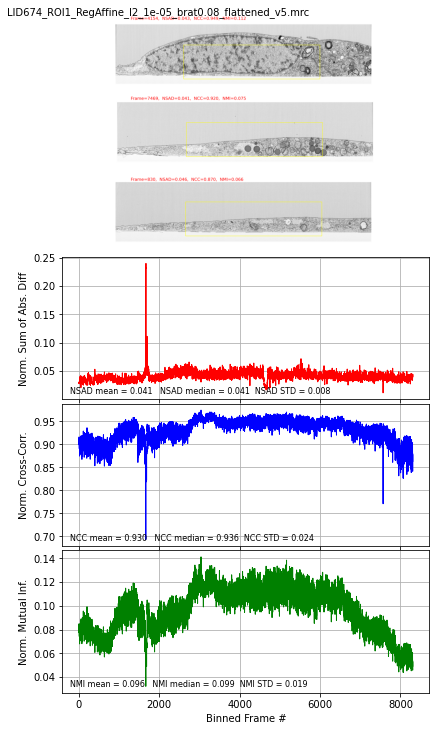

In [29]:
%%time

print('Step 7: Transform and Save the FIB-SEM data')

test_dataset.fnm_reg = 'LID674_ROI1_RegAffine_l2_1e-05_brat0.08_flattened_v5.mrc'

evaluation_box = [600, 1000, 2000, 4000]

reg_summary_RegAffine_ImB0p08_flattened_v5, reg_summary_RegAffine_ImB0p08_flattened_v5_xlsx = test_dataset.transform_and_save(DASK_client = client,
                                                        save_transformed_dataset = True,
                                                        save_registration_summary = True,
                                                        #frame_inds = np.arange(1500, 1800),
                                                        flatten_image = True,
                                                        image_scales = image_scales_v5,
                                                        image_offsets = image_offsets,
                                                        ImgB_fraction=0.08,
                                                        add_offset = True,
                                                        zbin_factor = 1,
                                                        evaluation_box = evaluation_box,
                                                        sliding_evaluation_box = False,
                                                        fnm_types = ['mrc'])

generate_report_from_xls_registration_summary(reg_summary_RegAffine_ImB0p08_flattened_v5_xlsx)

# Crop / Bin the Regsitered stack

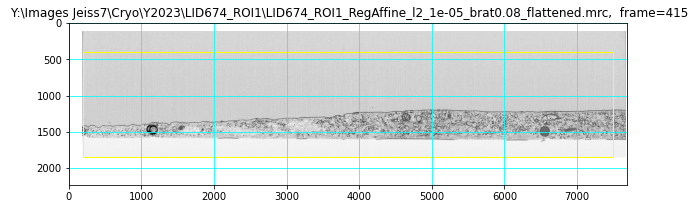

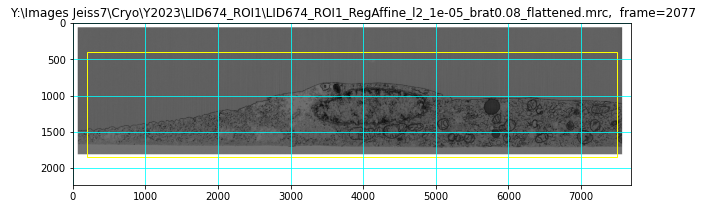

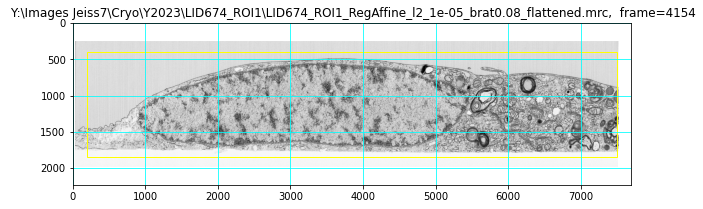

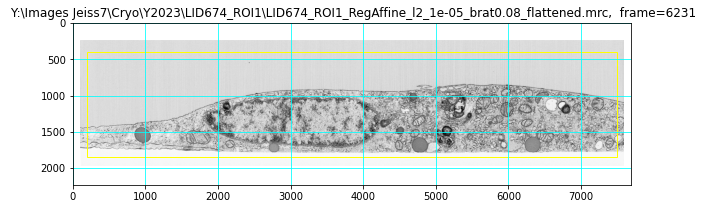

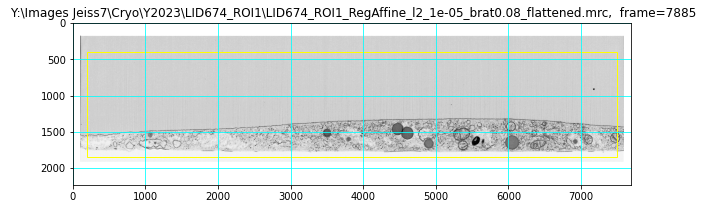

In [32]:
orig_mrc = os.path.normpath('Y:\Images Jeiss7\Cryo\Y2023\LID674_ROI1\LID674_ROI1_RegAffine_l2_1e-05_brat0.08_flattened.mrc')
evaluation_box = [400, 1450, 200, 7300]
show_eval_box_mrc_stack(orig_mrc,
                        evaluation_box = evaluation_box,
                        frame_inds = [len(fls)//20, len(fls)//4, len(fls)//2, len(fls)//4*3, len(fls)//20*19])

xi = evaluation_box[2]
xa = xi + evaluation_box[3]
yi = evaluation_box[0]
ya = yi + evaluation_box[1]

In [33]:
%%time
orig_mrc = os.path.normpath('Y:\Images Jeiss7\Cryo\Y2023\LID674_ROI1\LID674_ROI1_RegAffine_l2_1e-05_brat0.08_flattened.mrc')
cropped_mrc = orig_mrc.replace('.mrc', '_cropped.mrc')
bin_crop_mrc_stack(orig_mrc,
                   binned_copped_filename  = cropped_mrc,
                   DASK_client = client,
                   xi = xi,
                   xa = xa,
                   yi = yi,
                   ya = ya)

DASK client exists. Will perform distributed computations
Use http://localhost:63250/status to monitor DASK progress
Source mrc_mode: 1, source data type: <class 'numpy.int16'>
Source Voxel Size (Angstroms): 39.999279 x 39.999279 x 40.261986
2024/05/19  06:49:47   Result mrc_mode: 1, source data type: <class 'numpy.int16'>


Building Parameters Sets:   0%|          | 0/8309 [00:00<?, ?it/s]

2024/05/19  06:49:47   New Data Set Shape:  7300 x 1450 x 8309
2024/05/19  07:04:10   Result Voxel Size (Angstroms): 39.999279 x 39.999279 x 40.261986
2024/05/19  07:04:10   Using DASK distributed
2024/05/19  07:04:10   Starting DASK batch 0 with 5000 jobs, 3309 jobs remaining
2024/05/19  07:33:34   Starting DASK batch 1 with 3309 jobs
Wall time: 1h 12min 47s


In [34]:
%%time
binned_cropped_mrc = cropped_mrc.replace('.mrc', '_16nm.mrc')
bin_crop_mrc_stack(orig_mrc,
                   binned_copped_filename  = binned_cropped_mrc,
                   DASK_client = client,
                   xi = xi,
                   xa = xa,
                   yi = yi,
                   ya = ya,
                   xbin_factor=4,
                   ybin_factor=4,
                   zbin_factor=4)

DASK client exists. Will perform distributed computations
Use http://localhost:63250/status to monitor DASK progress
Source mrc_mode: 1, source data type: <class 'numpy.int16'>
Source Voxel Size (Angstroms): 39.999279 x 39.999279 x 40.261986
2024/05/19  08:02:34   Result mrc_mode: 1, source data type: <class 'numpy.int16'>


Building Parameters Sets:   0%|          | 0/2078 [00:00<?, ?it/s]

2024/05/19  08:02:34   New Data Set Shape:  1825 x 362 x 2078
2024/05/19  08:02:47   Result Voxel Size (Angstroms): 159.997116 x 159.997116 x 161.047943
2024/05/19  08:02:47   Using DASK distributed
2024/05/19  08:02:47   Starting DASK batch 0 with 2078 jobs
Wall time: 5min 2s


2024/05/19  08:07:37   EM cross-sections dimensions (um): [29.19947369  5.7918956  33.46576258]
Center coordinates (um): [14.59973684  2.8959478  16.73288129]


Loading EM Cross-sections Data:   0%|          | 0/3 [00:00<?, ?it/s]

2024/05/19  08:07:37   X-Y cross-section loaded, dimensions (pixels): 1825 362
2024/05/19  08:07:40   X-Z cross-section loaded, dimensions (pixels): 1825 2078
2024/05/19  08:08:37   Y-Z cross-section loaded, dimensions (pixels): 362 2078


Determining EM data range:   0%|          | 0/3 [00:00<?, ?it/s]

2024/05/19  08:08:38   Will use EM-data range: 171.1 - 976.3
Generating Cross-Section Images
2024/05/19  08:08:38   Generating X-Y cross-section
2024/05/19  08:08:38   Generating Y-Z cross-section
2024/05/19  08:08:38   Generating X-Z cross-section
2024/05/19  08:08:38   Saving image into:  Y:\Images Jeiss7\Cryo\Y2023\LID674_ROI1\LID674_ROI1_RegAffine_l2_1e-05_brat0.08_flattened_cropped_16nm_crosssections.png
Wall time: 1min 1s


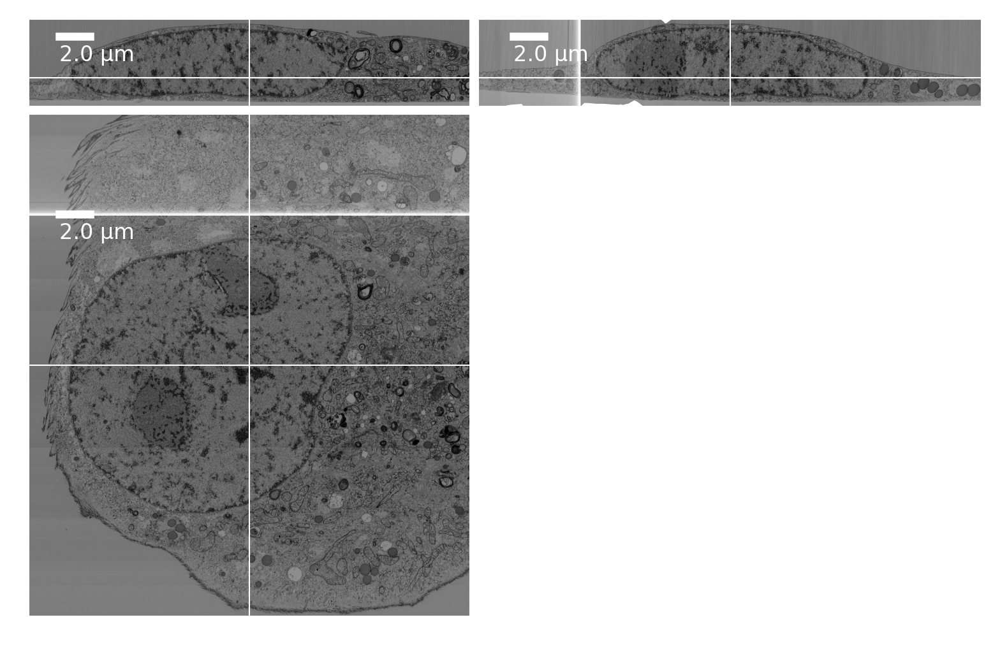

In [35]:
%%time
images, axs = plot_cross_sections_mrc_stack(binned_cropped_mrc,
                                            bar_length_um = 2,
                                            bar_width = 3,
                                            loc = (0.07, 0.80),
                                            xsection_offsets = [0.0, 1.0, 0.0],
                                            label_font_size=8,
                                            label_offset=50,
                                            dpi=300)

In [36]:
%%time
orig_mrc = os.path.normpath('Y:\Images Jeiss7\Cryo\Y2023\LID674_ROI1\LID674_ROI1_RegAffine_l2_1e-05_brat0.08_flattened_v5.mrc')
cropped_mrc = orig_mrc.replace('.mrc', '_cropped.mrc')
bin_crop_mrc_stack(orig_mrc,
                   binned_copped_filename  = cropped_mrc,
                   DASK_client = client,
                   xi = xi,
                   xa = xa,
                   yi = yi,
                   ya = ya)

DASK client exists. Will perform distributed computations
Use http://localhost:63250/status to monitor DASK progress
Source mrc_mode: 1, source data type: <class 'numpy.int16'>
Source Voxel Size (Angstroms): 39.999279 x 39.999279 x 40.261986
2024/05/19  08:08:41   Result mrc_mode: 1, source data type: <class 'numpy.int16'>


Building Parameters Sets:   0%|          | 0/8309 [00:00<?, ?it/s]

2024/05/19  08:08:41   New Data Set Shape:  7300 x 1450 x 8309
2024/05/19  08:22:44   Result Voxel Size (Angstroms): 39.999279 x 39.999279 x 40.261986
2024/05/19  08:22:44   Using DASK distributed
2024/05/19  08:22:44   Starting DASK batch 0 with 5000 jobs, 3309 jobs remaining
2024/05/19  08:51:39   Starting DASK batch 1 with 3309 jobs
Wall time: 1h 12min 5s


In [37]:
%%time
binned_cropped_mrc = cropped_mrc.replace('.mrc', '_16nm.mrc')
bin_crop_mrc_stack(orig_mrc,
                   binned_copped_filename  = binned_cropped_mrc,
                   DASK_client = client,
                   xi = xi,
                   xa = xa,
                   yi = yi,
                   ya = ya,
                   xbin_factor=4,
                   ybin_factor=4,
                   zbin_factor=4)

DASK client exists. Will perform distributed computations
Use http://localhost:63250/status to monitor DASK progress
Source mrc_mode: 1, source data type: <class 'numpy.int16'>
Source Voxel Size (Angstroms): 39.999279 x 39.999279 x 40.261986
2024/05/19  09:20:46   Result mrc_mode: 1, source data type: <class 'numpy.int16'>


Building Parameters Sets:   0%|          | 0/2078 [00:00<?, ?it/s]

2024/05/19  09:20:46   New Data Set Shape:  1825 x 362 x 2078
2024/05/19  09:20:59   Result Voxel Size (Angstroms): 159.997116 x 159.997116 x 161.047943
2024/05/19  09:20:59   Using DASK distributed
2024/05/19  09:20:59   Starting DASK batch 0 with 2078 jobs
Wall time: 4min 56s


2024/05/19  09:25:43   EM cross-sections dimensions (um): [29.19947369  5.7918956  33.46576258]
Center coordinates (um): [14.59973684  2.8959478  16.73288129]


Loading EM Cross-sections Data:   0%|          | 0/3 [00:00<?, ?it/s]

2024/05/19  09:25:43   X-Y cross-section loaded, dimensions (pixels): 1825 362
2024/05/19  09:25:46   X-Z cross-section loaded, dimensions (pixels): 1825 2078
2024/05/19  09:26:37   Y-Z cross-section loaded, dimensions (pixels): 362 2078


Determining EM data range:   0%|          | 0/3 [00:00<?, ?it/s]

2024/05/19  09:26:38   Will use EM-data range: 587.3 - 947.1
Generating Cross-Section Images
2024/05/19  09:26:38   Generating X-Y cross-section
2024/05/19  09:26:38   Generating Y-Z cross-section
2024/05/19  09:26:38   Generating X-Z cross-section
2024/05/19  09:26:38   Saving image into:  Y:\Images Jeiss7\Cryo\Y2023\LID674_ROI1\LID674_ROI1_RegAffine_l2_1e-05_brat0.08_flattened_v5_cropped_16nm_crosssections.png
Wall time: 56.3 s


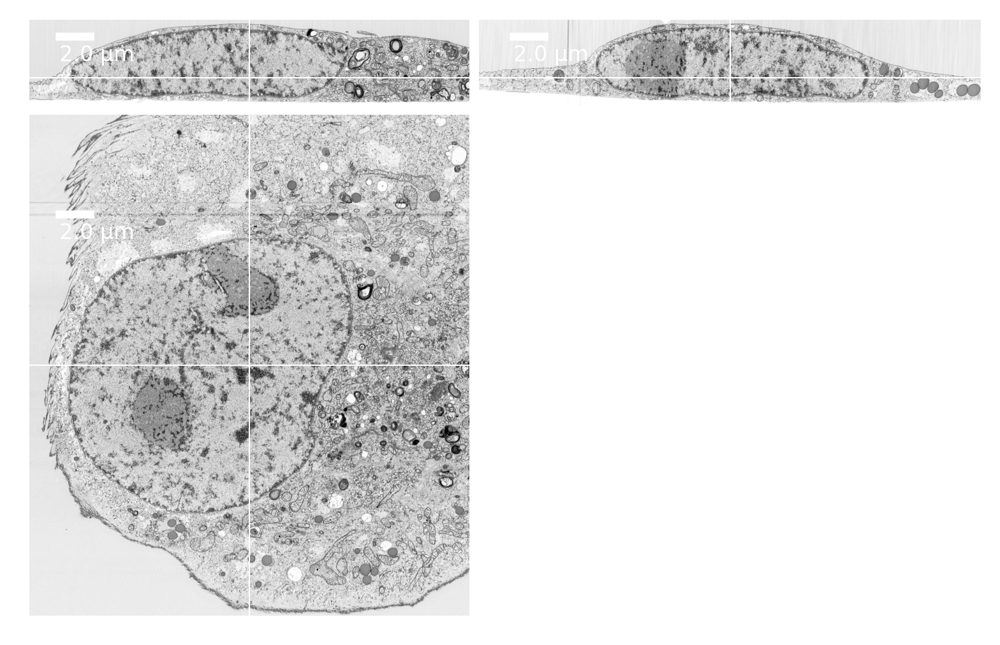

In [38]:
%%time
images, axs = plot_cross_sections_mrc_stack(binned_cropped_mrc,
                                            bar_length_um = 2,
                                            bar_width = 3,
                                            loc = (0.07, 0.80),
                                            xsection_offsets = [0.0, 1.0, 0.0],
                                            label_font_size=8,
                                            label_offset=50,
                                            dpi=300)

Step 7: Transform and Save the FIB-SEM data
DASK client exists. Will perform distributed computations
Use http://localhost:63250/status to monitor DASK progress
Transforming and Saving Intermediate Registered Frames
2024/05/19  09:27:22   Transform and Save Chunks of Frames: Starting DASK jobs
2024/05/19  09:50:55   Finished DASK jobs
Analyzing Registration Quality
2024/05/19  09:50:59   Analyzing Frame Registration: Starting DASK jobs
2024/05/19  10:06:30   Finished DASK jobs
2024/05/19  10:06:43   Saving the Registration Quality Statistics into the file:  Y:\Images Jeiss7\Cryo\Y2023\LID674_ROI1\LID674_ROI1_raw_RegistrationQuality.xlsx
Registered data set is NOT saved into a file


Removing Intermediate Registered Frame Files:   0%|          | 0/8309 [00:00<?, ?it/s]

Wall time: 44min 10s


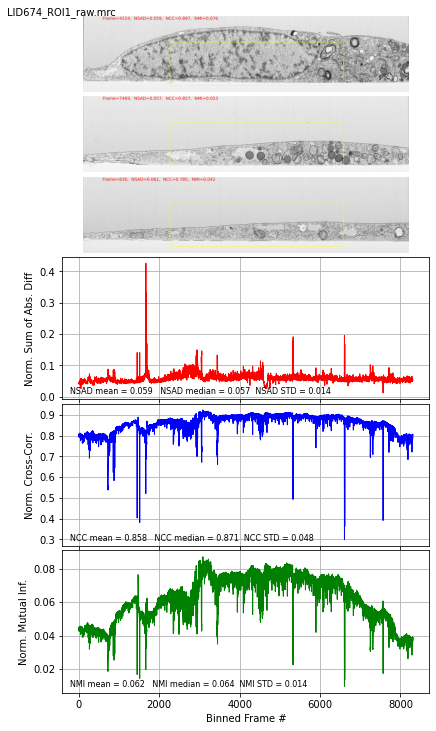

In [39]:
%%time

print('Step 7: Transform and Save the FIB-SEM data')

test_dataset.fnm_reg = 'LID674_ROI1_raw.mrc'

evaluation_box = [600, 1000, 2000, 4000]


reg_summary_raw, reg_summary_RegAffine_raw_xlsx = test_dataset.transform_and_save(DASK_client = client,
                                                        save_transformed_dataset = False,
                                                        save_registration_summary = True,
                                                        perform_transformation=False,
                                                        flatten_image = False,
                                                        ImgB_fraction=0.00,
                                                        add_offset = True,
                                                        zbin_factor = 1,
                                                        evaluation_box = evaluation_box,
                                                        sliding_evaluation_box = False,
                                                        fnm_types = ['mrc'])

generate_report_from_xls_registration_summary(reg_summary_RegAffine_raw_xlsx)

generating the registration quality summary plots:   0%|          | 0/4 [00:00<?, ?it/s]

saving the data into xlsx file:   0%|          | 0/4 [00:00<?, ?it/s]

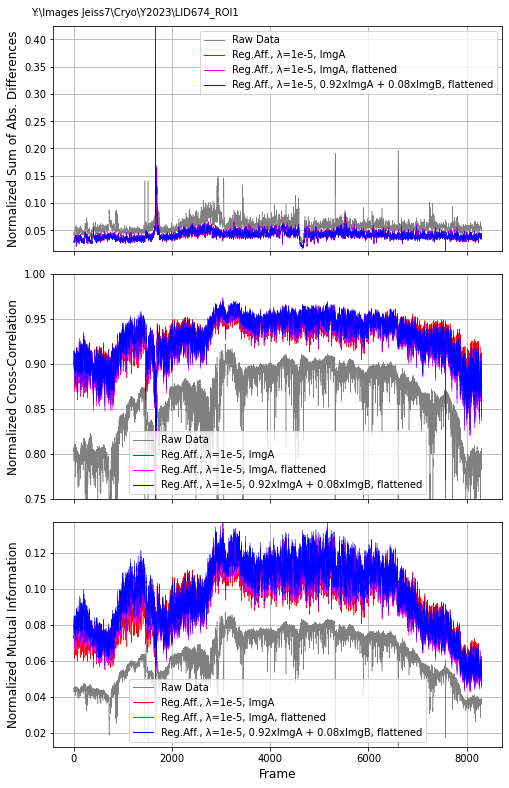

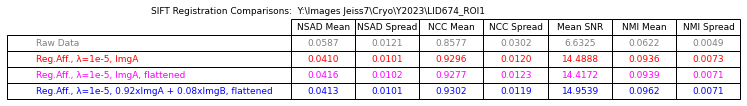

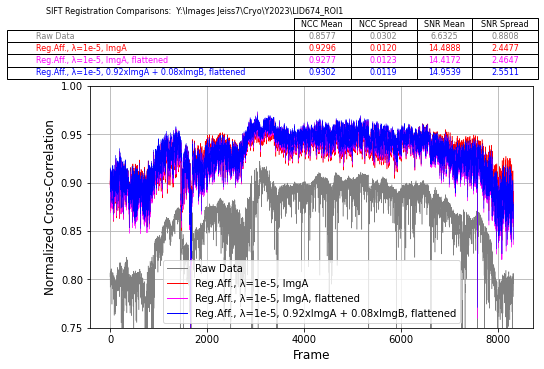

In [40]:
reg_qual_fls = [reg_summary_RegAffine_raw_xlsx,
                reg_summary_RegAffine_ImB0p00_xlsx,
                reg_summary_RegAffine_ImB0p00_flattened_xlsx,
                reg_summary_RegAffine_ImB0p08_flattened_xlsx]
pfs = ['Raw Data',
       'Reg.Aff., λ=1e-5, ImgA',
       'Reg.Aff., λ=1e-5, ImgA, flattened',
       'Reg.Aff., λ=1e-5, 0.92xImgA + 0.08xImgB, flattened']

colors = ['grey', 'red', 'magenta', 'blue']
linewidths = [0.5, 0.5, 0.4, 0.3, 0.2]

save_filename = os.path.join(data_dir, 'Regstration_Summary_LID674_ROI1.png')
plot_registrtion_quality_xlsx(reg_qual_fls, pfs, save_filename=save_filename,
                              linewidths = linewidths,
                              colors = colors,
                              ncc_bounds = [0.75, 1.0])
                              #nsad_bounds=[0.00, 0.15],
                              #nmi_bounds=[0.05, 0.20])

# add a plot of FiJi on top to make it more visible.
overplot = False
if overplot:
    ax = plt.gca()
    for j, fl in enumerate(reg_qual_fls[0:2]):
        rdata = data = pd.read_excel(fl, sheet_name='Registration Quality Statistics')
        image_ncc = np.array(rdata['Image NCC'])
        ax.plot(image_ncc, color=colors[j], linewidth=linewidths[j])
    fig = plt.gcf()

# Destreak and Smooth the Data 

array([  0.       , 929.9609375])

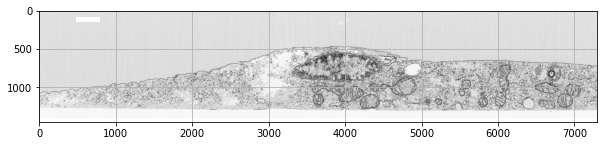

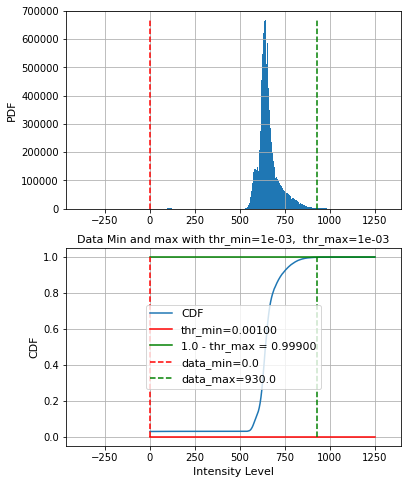

In [42]:
orig_mrc = os.path.normpath('Y:\Images Jeiss7\Cryo\Y2023\LID674_ROI1\LID674_ROI1_RegAffine_l2_1e-05_brat0.08_flattened_v5_cropped.mrc')
test_frame_ind = 2000


mrc_obj = mrcfile.mmap(orig_mrc, mode='r', permissive=True)
header = mrc_obj.header
'''
    mode 0 -> uint8
    mode 1 -> int16
    mode 2 -> float32
    mode 4 -> complex64
    mode 6 -> uint16
'''
mrc_mode = mrc_obj.header.mode
test_frame = mrc_obj.data[test_frame_ind, :, :]
mrc_obj.close()

vmin, vmax = get_min_max_thresholds(test_frame[200: -200, 200: -200], disp_res=False)
fig, ax = plt.subplots(1,1, figsize=(10, 10))
ax.imshow(test_frame, cmap='Greys', vmin=vmin, vmax=vmax)
ax.grid(True)
#ax.axis(False)
#ax.axis(False)
add_scale_bar(ax, pixel=0.004, bar_length=5.0, bar_width=5, bar_label='')

get_min_max_thresholds(test_frame)

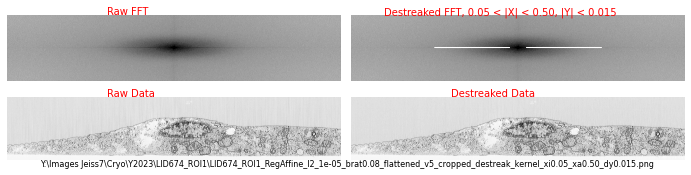

In [46]:
# define the destreak_kernel and estimate the performance

destreak_kernel_XY = True

if destreak_kernel_XY:   # destreaking isperformed by zeroing FFT data inside two symmetric bands along X-axis in FFT space
    xstart = 0.05
    xstop = 0.5
    dy = 0.015
else:                    # destreaking isperformed by zeroing FFT data inside angular segments FFT space (also limited in radial FFT coordinate)
    astart = -1.0
    astop = 1.0
    rstart = 0.05
    rstop = 0.5
    symmetry = 2

data_min = 0
data_max = 2000

clip_mask = (test_frame>data_min)*(test_frame<data_max)
ny, nx = np.shape(clip_mask)
try:
    yi = np.min(np.where(clip_mask[:, nx//2]))
except:
    yi = 0
try:
    ya = ny-np.max(np.where(clip_mask[:, nx//2]))
except:
    ya = 1
try:
    xi = np.min(np.where(clip_mask[ny//2, :]))
except:
    xi = 0
try:
    xa = nx-np.max(np.where(clip_mask[ny//2, :]))
except:
    xa = 1
pad_width = np.max((xi, xa, yi, ya))
padded_fr = clip_mask*test_frame + (1-clip_mask)*np.pad(test_frame[pad_width:-pad_width, pad_width:-pad_width], pad_width = pad_width, mode='symmetric')
img_fft = np.fft.fftshift(np.fft.fftn(np.fft.ifftshift(padded_fr)))

if destreak_kernel_XY:
    destreak_kernel = build_kernel_FFT_zero_destreaker_XY(img_fft,
                                                      xstart=xstart,
                                                    xstop=xstop,
                                                      dy = dy)
else:
    destreak_kernel = build_kernel_FFT_zero_destreaker_radii_angles(img_fft,
                                       astart = astart,
                                       astop = astop,
                                       rstart=rstart,
                                       rstop=rstop,
                                       symm=symmetry)

st = 1.0/np.sqrt(2.0)
kernel = np.array([[st, 1.0, st],[1.0,1.0,1.0], [st, 1.0, st]]).astype(float)
smooth_kernel = kernel/kernel.sum()

data_FT_abs = np.log(np.abs(img_fft))
vmin_FFT, vmax_FFT = get_min_max_thresholds(data_FT_abs, disp_res=False)

data_FT_abs_zr = data_FT_abs * destreak_kernel

params = [orig_mrc, type(test_frame[0, 0]), test_frame_ind, test_frame_ind, data_min, data_max]
j, destreaked_frame = destreak_single_frame_kernel_shared(destreak_kernel, params)

sx = 10
sy = sx * ny // nx + 1.5

fig, axs = plt.subplots(2,2, figsize=(sx, sy))
fig.subplots_adjust(left=0.03, bottom=0.07, right=0.97, top=0.97, wspace=0.03, hspace=0.03)

axs[0, 0].imshow(data_FT_abs, cmap='Greys', vmin=vmin_FFT, vmax=vmax_FFT)
axs[0, 0].text(0.3, 1.005, 'Raw FFT', color='red', transform=axs[0, 0].transAxes, fontsize=10)

if destreak_kernel_XY:
    lim_str1 = '{:.2f} < |X| < {:.2f}, |Y| < {:.3f}'.format(xstart, xstop, dy)
    lim_str2 = '_xi{:.2f}_xa{:.2f}_dy{:.3f}.png'.format(xstart, xstop, dy)
else:
    lim_str1 = '{:.1f} < α < {:.1f}, {:.2f} < R < {:.2f}, symm={:d}'.format(astart, astop, rstart, rstop, symmetry)
    lim_str2 = '_ai{:.1f}_aa{:.1f}_ri{:.2f}_ra{:.2f}_symm{:d}.png'.format(astart, astop, rstart, rstop, symmetry)

axs[0, 1].imshow(data_FT_abs_zr, cmap='Greys', vmin=vmin_FFT, vmax=vmax_FFT)
axs[0, 1].text(0.1, 1.005, 'Destreaked FFT, '+lim_str1, color='red', transform=axs[0, 1].transAxes, fontsize=10)

vmin_ds, vmax_ds = get_min_max_thresholds(destreaked_frame[200: -200, 200: -200], disp_res=False)
axs[1, 1].imshow(destreaked_frame, cmap='Greys', vmin=vmin_ds, vmax=vmax_ds)
axs[1, 1].text(0.3, 1.005, 'Destreaked Data', color='red', transform=axs[1, 1].transAxes, fontsize=10)

axs[1, 0].imshow(test_frame, cmap='Greys', vmin=vmin, vmax=vmax, zorder=10)
axs[1, 0].text(0.3, 1.005, 'Raw Data', color='red', transform=axs[1,0].transAxes, fontsize=10)

for ax in axs.ravel():
    ax.axis(False)

save_png_name = orig_mrc.replace('.mrc', '_destreak_kernel'+lim_str2)
axs[1, 1].text(0.1, -0.04, save_png_name, transform=axs[1, 0].transAxes, fontsize=8)
fig.savefig(save_png_name, dpi=600)

In [47]:
%%time

destreaked_mrc = orig_mrc.replace('.mrc', '_destreaked.mrc')

saved_destreak_filename =  destreak_mrc_stack_with_kernel(orig_mrc,
                                                           destreak_kernel,
                                                           data_min, data_max,
                                                           DASK_client = client,
                                                          #fra=100,
                                                           save_filename = destreaked_mrc)
print(time.strftime('%Y/%m/%d  %H:%M:%S')+'   Destreaked data saved into: ', saved_destreak_filename)

DASK client exists. Will perform distributed computations
Use http://localhost:63250/status to monitor DASK progress
Source mrc_mode: 1, source data type: <class 'numpy.int16'>
Source Data Shape:  7300 x 1450 x 8309
Source Voxel Size (Angstroms): 39.999279 x 39.999279 x 40.261986
Result mrc_mode: 1, source data type: <class 'numpy.int16'>
New Data Shape:  7300 x 1450 x 8309
Result Voxel Size (Angstroms): 39.999279 x 39.999279 x 40.261986


Creating params list:   0%|          | 0/8309 [00:00<?, ?it/s]

2024/05/19  10:37:15   Using DASK distributed
Destreaked data saved into:  Y:\Images Jeiss7\Cryo\Y2023\LID674_ROI1\LID674_ROI1_RegAffine_l2_1e-05_brat0.08_flattened_v5_cropped_destreaked.mrc
Wall time: 1h 35min 40s


array([  0.     , 923.28125])

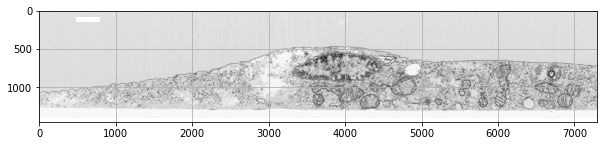

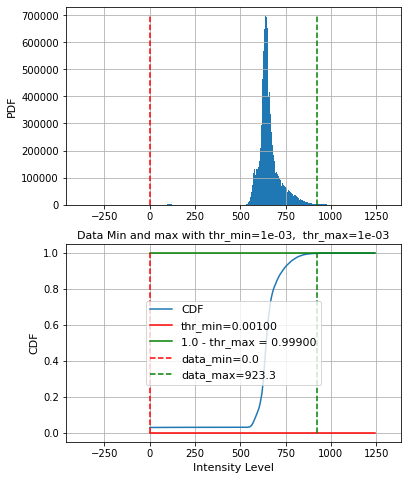

In [48]:
orig_mrc = os.path.normpath('Y:\Images Jeiss7\Cryo\Y2023\LID674_ROI1\LID674_ROI1_RegAffine_l2_1e-05_brat0.08_flattened_v5_cropped.mrc')
destreaked_mrc = orig_mrc.replace('.mrc', '_destreaked.mrc')
test_frame_ind = 2000

mrc_obj = mrcfile.mmap(destreaked_mrc, mode='r', permissive=True)
header = mrc_obj.header
'''
    mode 0 -> uint8
    mode 1 -> int16
    mode 2 -> float32
    mode 4 -> complex64
    mode 6 -> uint16
'''
mrc_mode = mrc_obj.header.mode
test_frame = mrc_obj.data[test_frame_ind, :, :]
mrc_obj.close()

vmin, vmax = get_min_max_thresholds(test_frame[200: -200, 200: -200], disp_res=False)
fig, ax = plt.subplots(1,1, figsize=(10, 10))
ax.imshow(test_frame, cmap='Greys', vmin=vmin, vmax=vmax)
ax.grid(True)
#ax.axis(False)
#ax.axis(False)
add_scale_bar(ax, pixel=0.004, bar_length=5.0, bar_width=5, bar_label='')

get_min_max_thresholds(test_frame)

In [49]:
%%time
st = 1.0/np.sqrt(2.0)
kernel = np.array([[st, 1.0, st],[1.0,1.0,1.0], [st, 1.0, st]]).astype(float)
smooth_kernel = kernel/kernel.sum()

smoothed_mrc = destreaked_mrc.replace('.mrc', '_smoothed.mrc')
data_min = 200
data_max = 2000
saved_smooth_filename =  smooth_mrc_stack_with_kernel(destreaked_mrc,
                                                           smooth_kernel,
                                                           data_min, data_max,
                                                           DASK_client = client,
                                                           # fra = 100,
                                                           save_filename = smoothed_mrc)
print(time.strftime('%Y/%m/%d  %H:%M:%S')+'   Destreaked and Smoothed data saved into: ', saved_smooth_filename)

DASK client exists. Will perform distributed computations
Use http://localhost:63250/status to monitor DASK progress
Source mrc_mode: 1, source data type: <class 'numpy.int16'>
Source Data Shape:  7300 x 1450 x 8309
Source Voxel Size (Angstroms): 39.999279 x 39.999279 x 40.261986
Result mrc_mode: 1, source data type: <class 'numpy.int16'>
New Data Shape:  7300 x 1450 x 8309
Result Voxel Size (Angstroms): 39.999279 x 39.999279 x 40.261986


Creating params list:   0%|          | 0/8309 [00:00<?, ?it/s]

2024/05/19  12:13:38   Using DASK distributed
2024/05/19  13:26:17   Destreaked and Smoothed data saved into:  Y:\Images Jeiss7\Cryo\Y2023\LID674_ROI1\LID674_ROI1_RegAffine_l2_1e-05_brat0.08_flattened_v5_cropped_destreaked_smoothed.mrc
Wall time: 1h 26min 20s


In [50]:
%%time
binned_cropped_mrc = destreaked_mrc.replace('.mrc', '_16nm.mrc')
bin_crop_mrc_stack(destreaked_mrc,
                   binned_copped_filename = binned_cropped_mrc,
                   DASK_client = client,
                   xbin_factor=4,
                   ybin_factor=4,
                   zbin_factor=4)

DASK client exists. Will perform distributed computations
Use http://localhost:63250/status to monitor DASK progress
Source mrc_mode: 1, source data type: <class 'numpy.int16'>
Source Voxel Size (Angstroms): 39.999279 x 39.999279 x 40.261986
2024/05/19  13:26:17   Result mrc_mode: 1, source data type: <class 'numpy.int16'>


Building Parameters Sets:   0%|          | 0/2078 [00:00<?, ?it/s]

2024/05/19  13:26:17   New Data Set Shape:  1825 x 362 x 2078
2024/05/19  13:26:29   Result Voxel Size (Angstroms): 159.997116 x 159.997116 x 161.047943
2024/05/19  13:26:29   Using DASK distributed
2024/05/19  13:26:29   Starting DASK batch 0 with 2078 jobs
Wall time: 3min 27s


2024/05/19  13:29:45   EM cross-sections dimensions (um): [29.19947369  5.7918956  33.46576258]
Center coordinates (um): [14.59973684  2.8959478  16.73288129]


Loading EM Cross-sections Data:   0%|          | 0/3 [00:00<?, ?it/s]

2024/05/19  13:29:45   X-Y cross-section loaded, dimensions (pixels): 1825 362
2024/05/19  13:29:48   X-Z cross-section loaded, dimensions (pixels): 1825 2078
2024/05/19  13:30:52   Y-Z cross-section loaded, dimensions (pixels): 362 2078


Determining EM data range:   0%|          | 0/3 [00:00<?, ?it/s]

2024/05/19  13:30:52   Will use EM-data range: 587.4 - 946.6
Generating Cross-Section Images
2024/05/19  13:30:52   Generating X-Y cross-section
2024/05/19  13:30:53   Generating Y-Z cross-section
2024/05/19  13:30:53   Generating X-Z cross-section
2024/05/19  13:30:53   Saving image into:  Y:\Images Jeiss7\Cryo\Y2023\LID674_ROI1\LID674_ROI1_RegAffine_l2_1e-05_brat0.08_flattened_v5_cropped_destreaked_16nm_crosssections.png
Wall time: 1min 9s


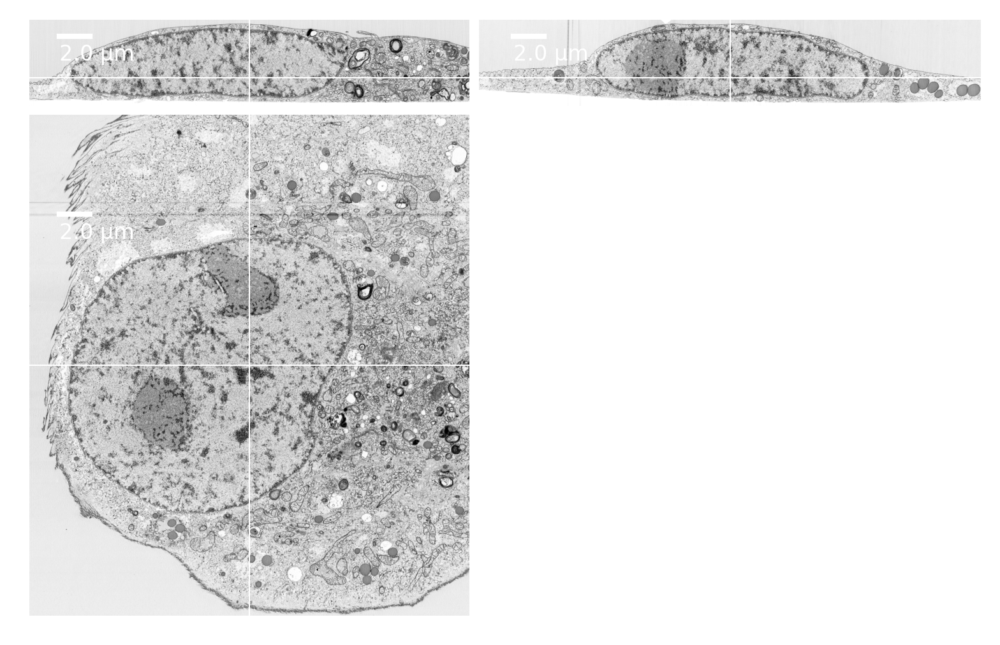

In [51]:
%%time
gc.collect()
images, axs = plot_cross_sections_mrc_stack(binned_cropped_mrc,
                                            bar_length_um = 2,
                                            bar_width = 2,
                                            loc = (0.07, 0.80),
                                            xsection_offsets = [0.0, 1.0, 0.0],
                                            label_font_size=8,
                                            label_offset=50,
                                            dpi=300)

In [52]:
%%time
binned_cropped_mrc = smoothed_mrc.replace('.mrc', '_16nm.mrc')
bin_crop_mrc_stack(smoothed_mrc,
                   binned_copped_filename = binned_cropped_mrc,
                   DASK_client = client,
                   xbin_factor=4,
                   ybin_factor=4,
                   zbin_factor=4)

DASK client exists. Will perform distributed computations
Use http://localhost:63250/status to monitor DASK progress
Source mrc_mode: 1, source data type: <class 'numpy.int16'>
Source Voxel Size (Angstroms): 39.999279 x 39.999279 x 40.261986
2024/05/19  13:30:55   Result mrc_mode: 1, source data type: <class 'numpy.int16'>


Building Parameters Sets:   0%|          | 0/2078 [00:00<?, ?it/s]

2024/05/19  13:30:55   New Data Set Shape:  1825 x 362 x 2078
2024/05/19  13:31:08   Result Voxel Size (Angstroms): 159.997116 x 159.997116 x 161.047943
2024/05/19  13:31:08   Using DASK distributed
2024/05/19  13:31:08   Starting DASK batch 0 with 2078 jobs
Wall time: 4min 21s


2024/05/19  13:35:17   EM cross-sections dimensions (um): [29.19947369  5.7918956  33.46576258]
Center coordinates (um): [14.59973684  2.8959478  16.73288129]


Loading EM Cross-sections Data:   0%|          | 0/3 [00:00<?, ?it/s]

2024/05/19  13:35:18   X-Y cross-section loaded, dimensions (pixels): 1825 362
2024/05/19  13:35:20   X-Z cross-section loaded, dimensions (pixels): 1825 2078
2024/05/19  13:36:13   Y-Z cross-section loaded, dimensions (pixels): 362 2078


Determining EM data range:   0%|          | 0/3 [00:00<?, ?it/s]

2024/05/19  13:36:14   Will use EM-data range: 587.9 - 940.5
Generating Cross-Section Images
2024/05/19  13:36:14   Generating X-Y cross-section
2024/05/19  13:36:14   Generating Y-Z cross-section
2024/05/19  13:36:14   Generating X-Z cross-section
2024/05/19  13:36:14   Saving image into:  Y:\Images Jeiss7\Cryo\Y2023\LID674_ROI1\LID674_ROI1_RegAffine_l2_1e-05_brat0.08_flattened_v5_cropped_destreaked_smoothed_16nm_crosssections.png
Wall time: 58 s


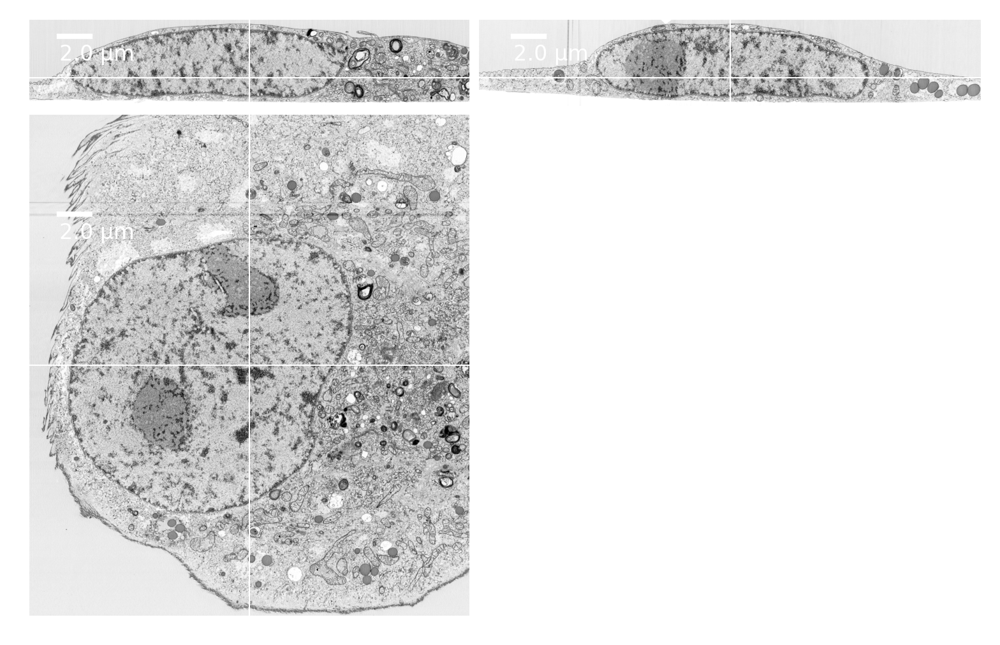

In [53]:
%%time
gc.collect()
images, axs = plot_cross_sections_mrc_stack(binned_cropped_mrc,
                                            bar_length_um = 2,
                                            bar_width = 2,
                                            loc = (0.07, 0.80),
                                            xsection_offsets = [0.0, 1.0, 0.0],
                                            label_font_size=8,
                                            label_offset=50,
                                            dpi=300)

# Estimate X-Y Resolution

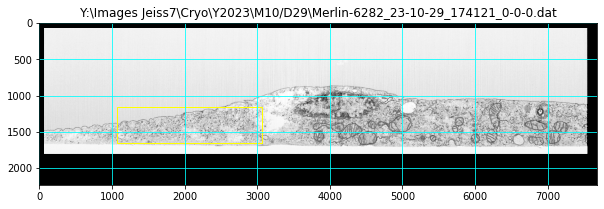

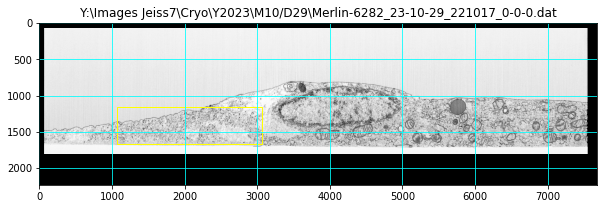

In [54]:
evaluation_box = [1100, 500, 1000, 2000]
fr_ind = 2000
test_dataset.show_eval_box(invert_data=False,
                           frame_inds = [fr_ind, fr_ind+100],
                           evaluation_box=evaluation_box)

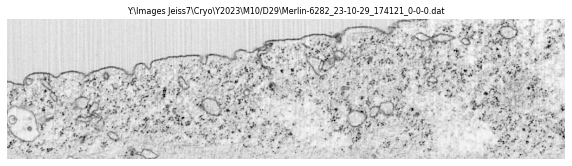

In [55]:
xi = evaluation_box[2]
xa = xi + evaluation_box[3]
yi = evaluation_box[0]
ya = yi + evaluation_box[1]
test_image = FIBSEM_frame(fls[fr_ind]).ImageA[yi:ya, xi:xa]
fig, ax = plt.subplots(1,1, figsize=(10,10))
vmin, vmax = get_min_max_thresholds(test_image, disp_res=False)
ax.imshow(test_image, cmap='Greys', vmin=vmin, vmax=vmax)
ax.axis(False)
ax.set_title(fls[fr_ind], fontsize = 8)
res_fname = os.path.join(data_dir, os.path.split(fls[fr_ind])[1].replace('.dat', '_' + image_name + '_subset.png'))
fig.savefig(res_fname, dpi=300)
tiff.imsave(res_fname.replace('.dat', '_subset.tiff'), test_image)

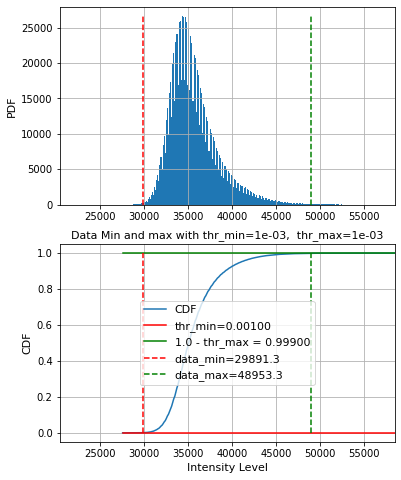

In [56]:
vmin, vmax = get_min_max_thresholds(test_image, disp_res=True)

DASK client exists. Will perform distributed computations
Use http://localhost:63250/status to monitor DASK progress
2024/05/19  14:38:48   Using DASK distributed


C:\Users\labadmin\Miniconda3\envs\sandbox\lib\site-packages\distributed\worker.py:3101: UserWarning: Large object of size 2.43 MB detected in task graph: 
  ([array(['Y:\\Images Jeiss7\\Cryo\\Y2023\\M10/D26\ ... False, False],)
Consider scattering large objects ahead of time
with client.scatter to reduce scheduler burden and 
keep data on workers

    future = client.submit(func, big_data)    # bad

    big_future = client.scatter(big_data)     # good
    future = client.submit(func, big_future)  # good
  % (format_bytes(len(b)), s)


2024/05/19  14:41:00   Finished computations, generating reports


Generating images/plots for the sample 2D blobs:   0%|          | 0/6 [00:00<?, ?it/s]

Wall time: 4min 4s


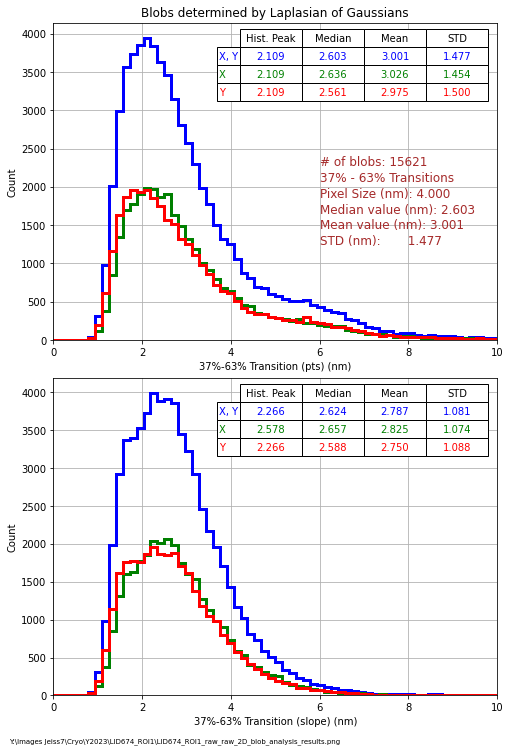

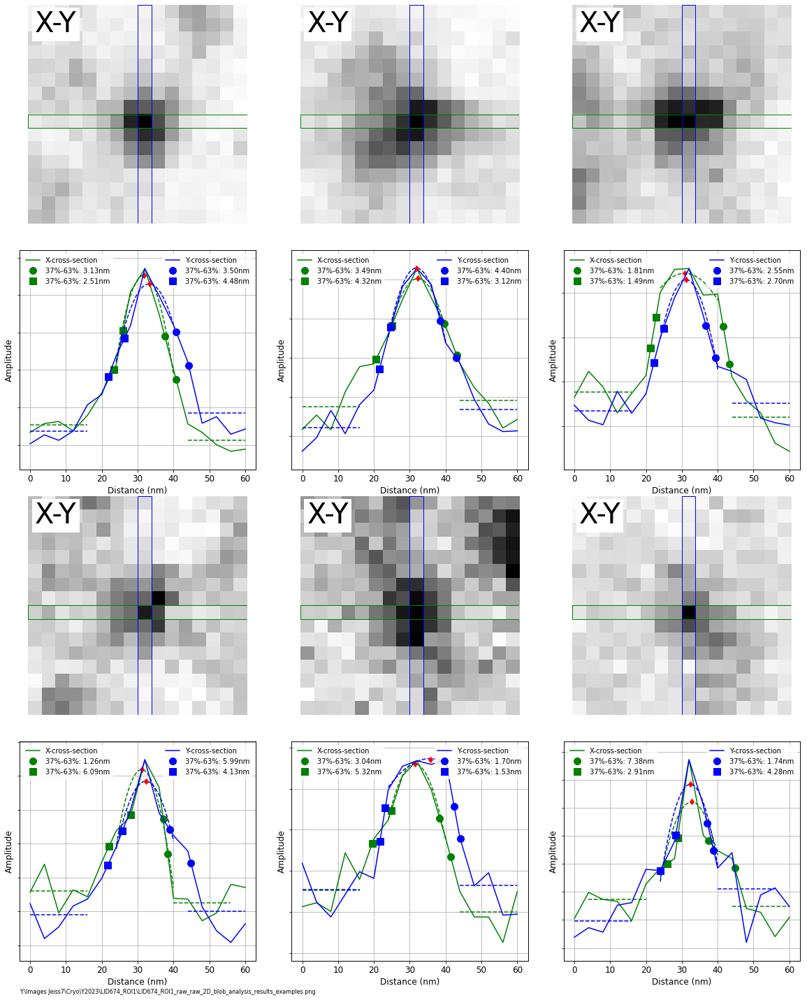

In [57]:
%%time

min_sigma = 1.0          # sigma (in pixel units) for Gaussian kernel in LoG search
max_sigma = 1.5          # sigma (in pixel units) for Gaussian kernel in LoG search
threshold = 3000        # threshold for LoG search. The absolute lower bound for scale space maxima. Local maxima smaller
                         # than threshold are ignored. Reduce this to detect blobs with less intensities
overlap = 0.1            # A value between 0 and 1. If the area of two blobs overlaps by a fraction greater than 'overlap', the smaller blob is eliminated.
pixel_size = 4.0         #  pixel size in nm
subset_size = 16         #  subset size (pixels) for blob / transition analysis
bounds = [0.37, 0.63]    #  List of of transition limits
bands = [5, 5, 5]        # list of three ints for the averaging bands for determining the left min, peak, and right min of the cross-section profile.
min_thr = 0.4            # threshold for identifying a 'good' transition (bottom < min_thr* top)

perform_transformation = False
if perform_transformation:
    results_file_xlsx =os.path.join(data_dir, os.path.splitext(test_dataset.fnm_reg)[0]+'_transformed_2D_blob_analysis_results.xlsx')
else:
    results_file_xlsx =os.path.join(data_dir, os.path.splitext(test_dataset.fnm_reg)[0]+'_raw_2D_blob_analysis_results.xlsx')
results = test_dataset.estimate_resolution_blobs_2D(DASK_client=client,
                                               use_DASK=True,
                                               image_name='ImageA',
                                               frame_inds = fr_ind + np.arange(100),
                                               evaluation_box=evaluation_box,
                                              min_sigma = min_sigma,
                                              max_sigma = max_sigma,
                                              threshold = threshold,
                                              overlap = overlap,
                                              pixel_size = pixel_size,
                                              subset_size = subset_size,
                                              bounds = bounds,
                                              bands = bands,
                                              min_thr = min_thr,
                                              title = fls[fr_ind],
                                              verbose = False,
                                              disp_res = False,
                                              perform_transformation = perform_transformation,
                                              save_data_xlsx =True,
                                            results_file_xlsx = results_file_xlsx)

print(time.strftime('%Y/%m/%d  %H:%M:%S')+'   Finished computations, generating reports')

results_file_xlsx, frame_inds, error_flags, blobs_LoG, tr_results = results
save_fname = results_file_xlsx.replace('.xlsx', '.png')
plot_2D_blob_results(results_file_xlsx, save_png=True, save_fname=save_fname)
save_fname = results_file_xlsx.replace('.xlsx', '_examples.png')
plot_2D_blob_examples(results_file_xlsx, save_png=True, save_fname=save_fname)

DASK client exists. Will perform distributed computations
Use http://localhost:63250/status to monitor DASK progress
2024/05/19  14:42:55   Using DASK distributed
2024/05/19  14:44:56   Finished computations, generating reports


Generating images/plots for the sample 2D blobs:   0%|          | 0/6 [00:00<?, ?it/s]

Wall time: 3min 46s


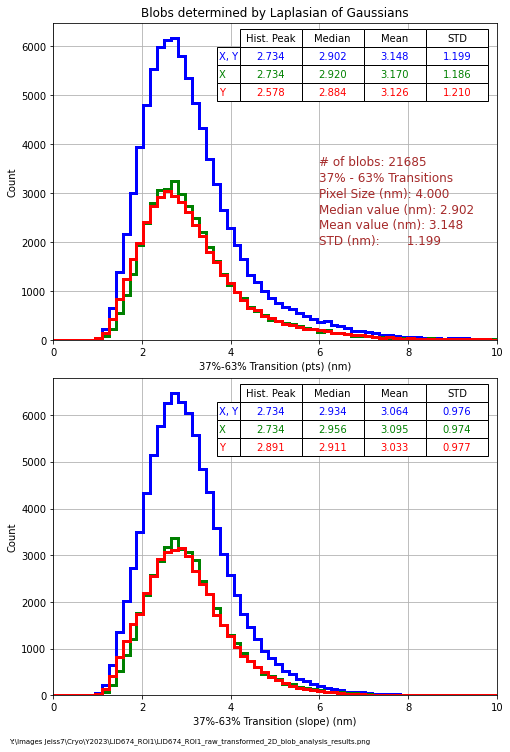

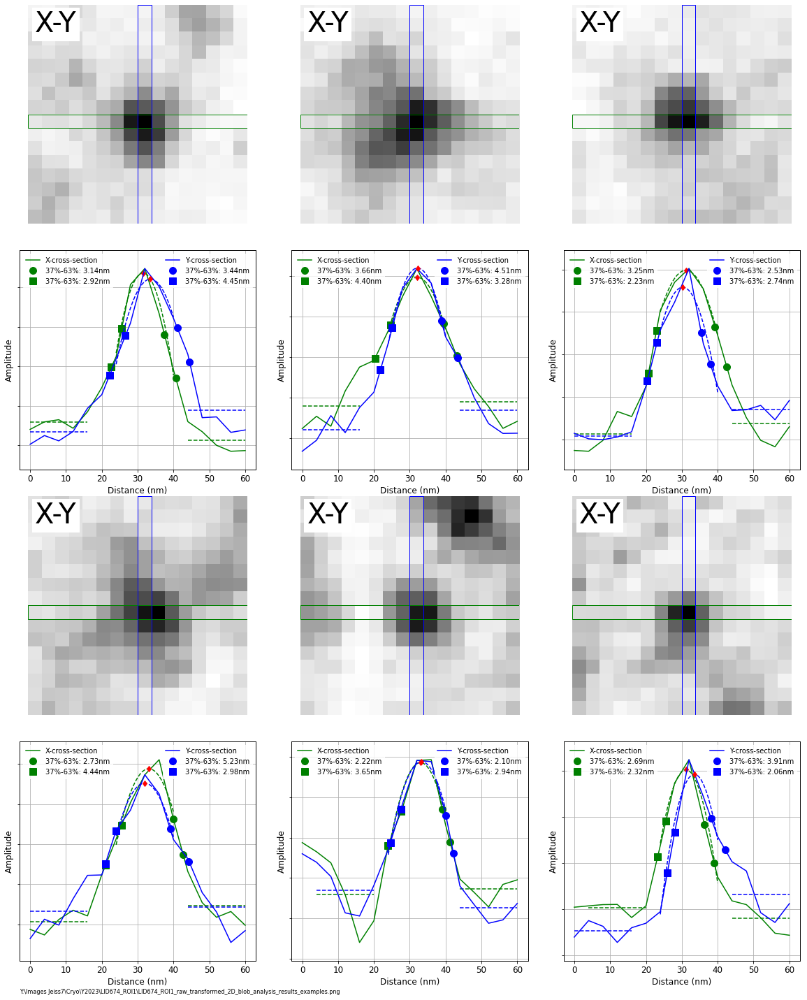

In [58]:
%%time

min_sigma = 1.0          # sigma (in pixel units) for Gaussian kernel in LoG search
max_sigma = 1.5          # sigma (in pixel units) for Gaussian kernel in LoG search
#threshold = 2800        # threshold for LoG search. The absolute lower bound for scale space maxima. Local maxima smaller
                         # than threshold are ignored. Reduce this to detect blobs with less intensities
overlap = 0.1            # A value between 0 and 1. If the area of two blobs overlaps by a fraction greater than 'overlap', the smaller blob is eliminated.
pixel_size = 4.0         #  pixel size in nm
subset_size = 16         #  subset size (pixels) for blob / transition analysis
bounds = [0.37, 0.63]    #  List of of transition limits
bands = [5, 5, 5]        # list of three ints for the averaging bands for determining the left min, peak, and right min of the cross-section profile.
min_thr = 0.4            # threshold for identifying a 'good' transition (bottom < min_thr* top)

perform_transformation = True
if perform_transformation:
    results_file_xlsx =os.path.join(data_dir, os.path.splitext(test_dataset.fnm_reg)[0]+'_transformed_2D_blob_analysis_results.xlsx')
else:
    results_file_xlsx =os.path.join(data_dir, os.path.splitext(test_dataset.fnm_reg)[0]+'_raw_2D_blob_analysis_results.xlsx')
results = test_dataset.estimate_resolution_blobs_2D(DASK_client=client,
                                               use_DASK=True,
                                               image_name='ImageA',
                                               frame_inds = fr_ind + np.arange(100),
                                               evaluation_box=evaluation_box,
                                              min_sigma = min_sigma,
                                              max_sigma = max_sigma,
                                              threshold = threshold,
                                              overlap = overlap,
                                              pixel_size = pixel_size,
                                              subset_size = subset_size,
                                              bounds = bounds,
                                              bands = bands,
                                              min_thr = min_thr,
                                              title = fls[fr_ind],
                                              verbose = False,
                                              disp_res = False,
                                              perform_transformation = perform_transformation,
                                              save_data_xlsx =True,
                                            results_file_xlsx = results_file_xlsx)

print(time.strftime('%Y/%m/%d  %H:%M:%S')+'   Finished computations, generating reports')

results_file_xlsx, frame_inds, error_flags, blobs_LoG, tr_results = results
save_fname = results_file_xlsx.replace('.xlsx', '.png')
plot_2D_blob_results(results_file_xlsx, save_png=True, save_fname=save_fname)
save_fname = results_file_xlsx.replace('.xlsx', '_examples.png')
plot_2D_blob_examples(results_file_xlsx, save_png=True, save_fname=save_fname)